In [1]:
# Standard, ML, and Finance Imports
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from torch.cuda.amp import GradScaler, autocast
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import yfinance as yf
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from datetime import date, timedelta
import joblib
import pickle
import warnings
import json
import optuna

warnings.filterwarnings('ignore')
optuna.logging.set_verbosity(optuna.logging.WARNING)

# Set up device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Usando dispositivo: {device}")
if torch.cuda.is_available():
    print(f"Versión de PyTorch: {torch.__version__}")
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    torch.cuda.empty_cache()

Usando dispositivo: cuda
Versión de PyTorch: 2.5.1
GPU: NVIDIA GeForce RTX 4060 Laptop GPU


Descargando datos históricos (OHLC) de 2020-08-07 a 2025-08-06...


[**********************89%******************     ]  31 of 35 completedHTTP Error 404: 
[*********************100%***********************]  35 of 35 completed

2 Failed downloads:
['AMX.MX', 'PEOLES.MX']: YFTzMissingError('possibly delisted; no timezone found')


Descarga completada.
Se encontraron 29 tickers válidos para procesar.

DataFrame de precios de cierre procesado con dimensiones: (1301, 33)

Generando gráficos de series de tiempo por cada activo...
Procesando y graficando para WALMEX.MX...


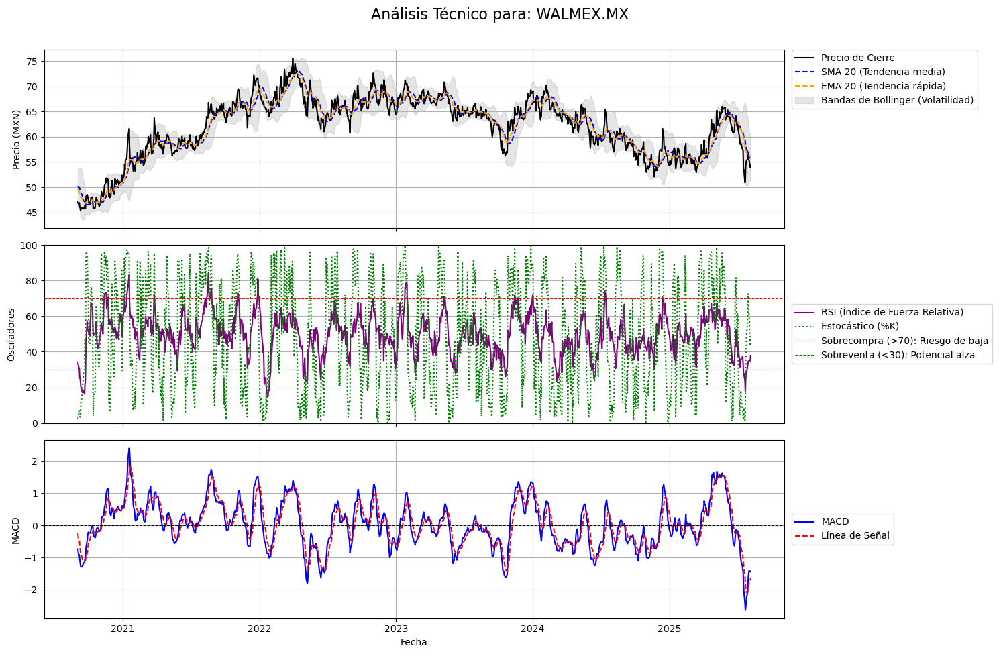

Procesando y graficando para GFNORTEO.MX...


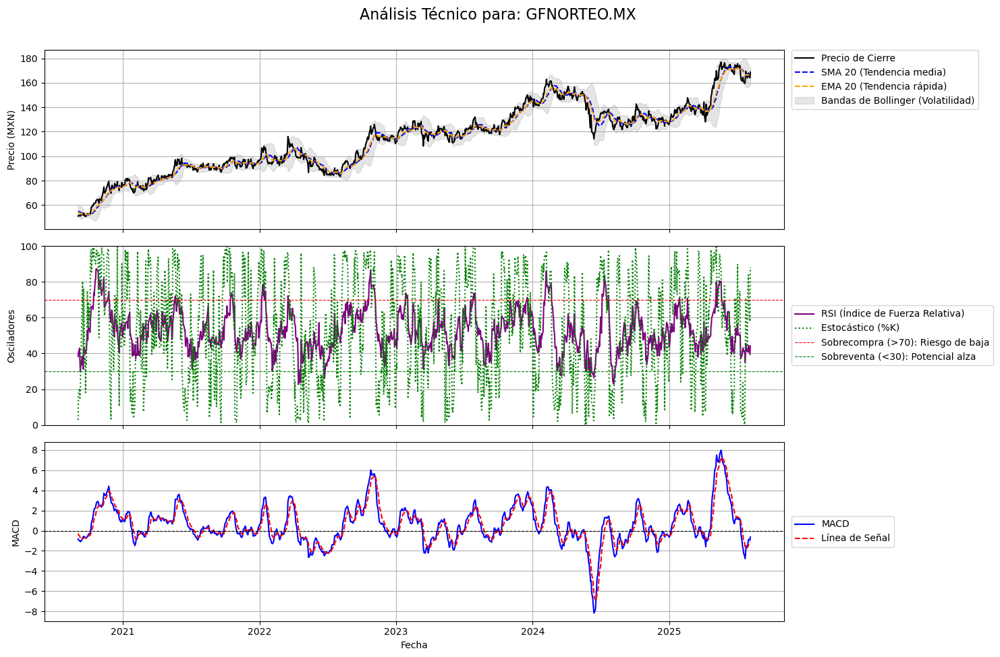

Procesando y graficando para FEMSAUBD.MX...


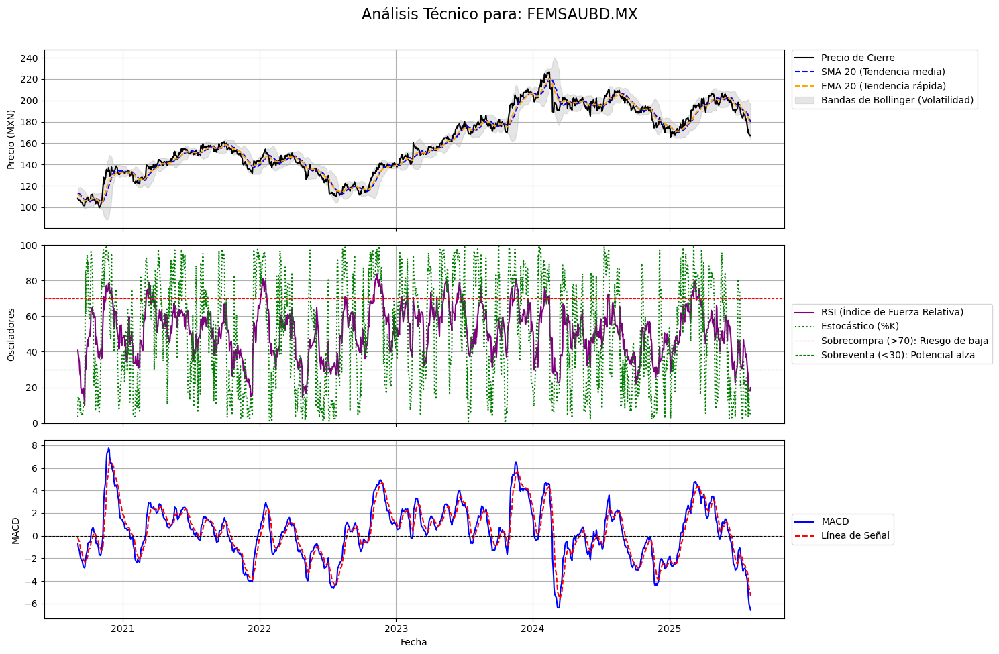

Procesando y graficando para GMEXICOB.MX...


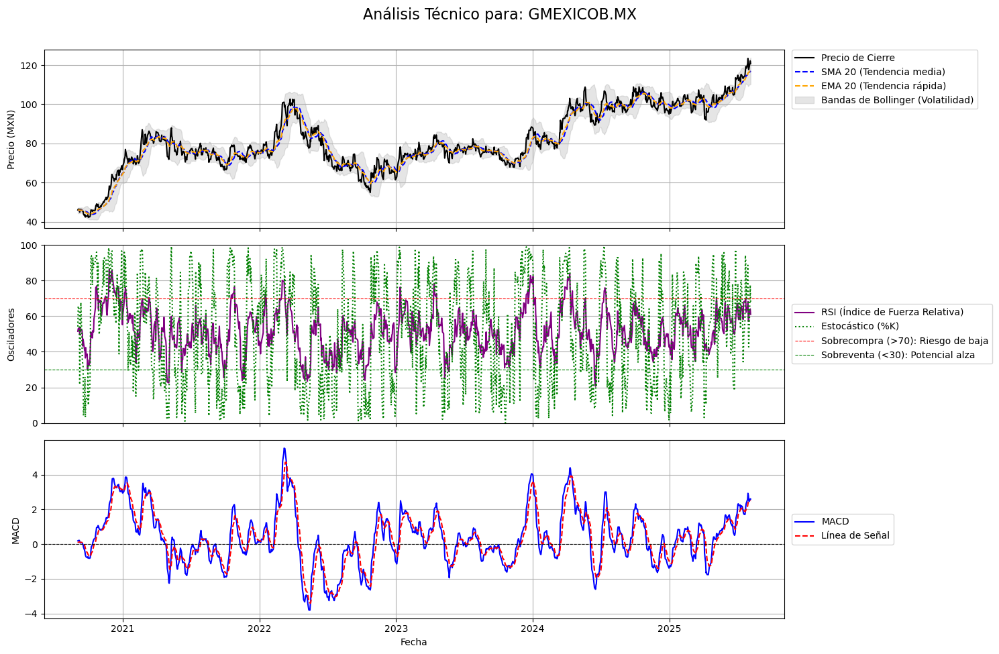

Procesando y graficando para CEMEXCPO.MX...


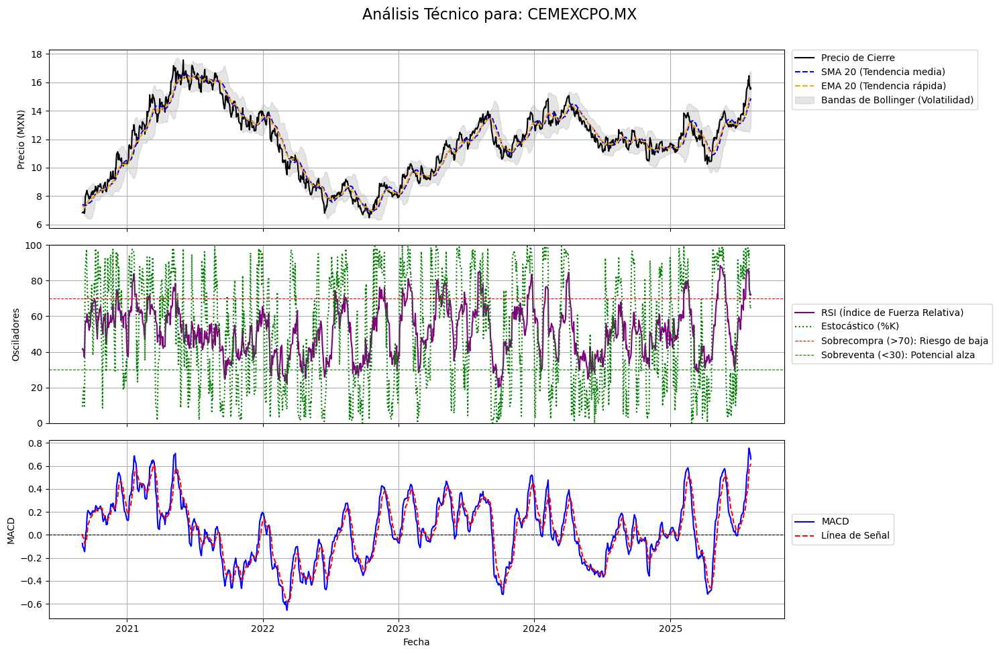

Procesando y graficando para GFINBURO.MX...


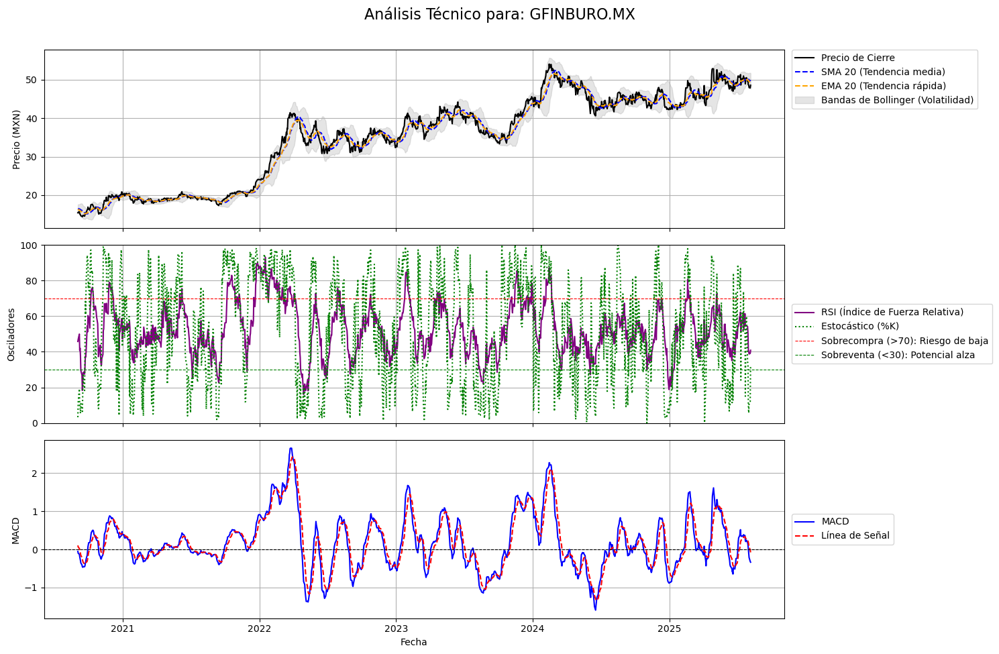

Procesando y graficando para BIMBOA.MX...


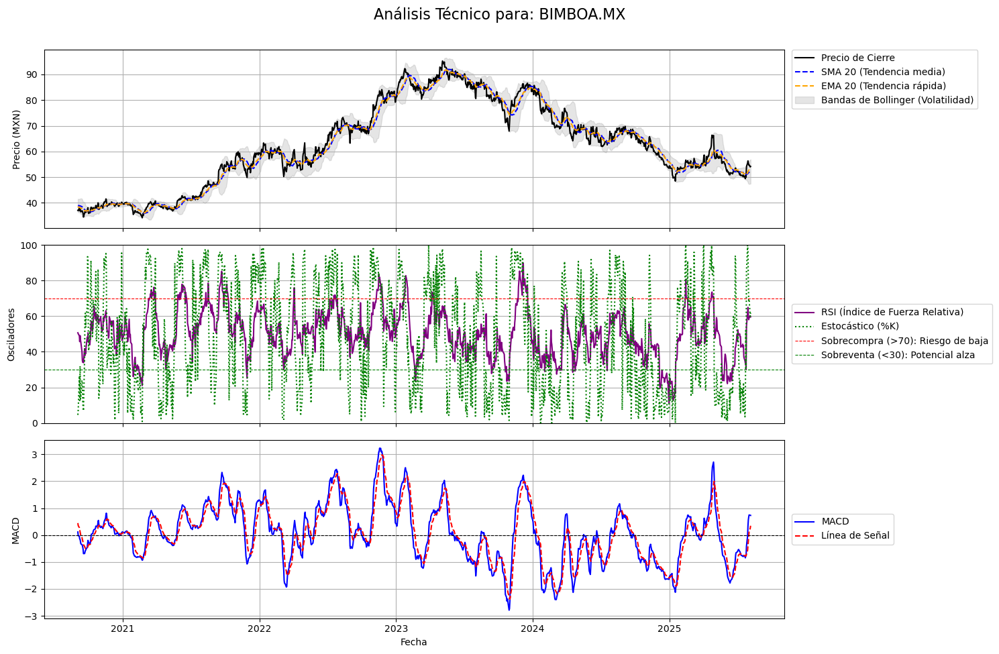

Procesando y graficando para TLEVISACPO.MX...


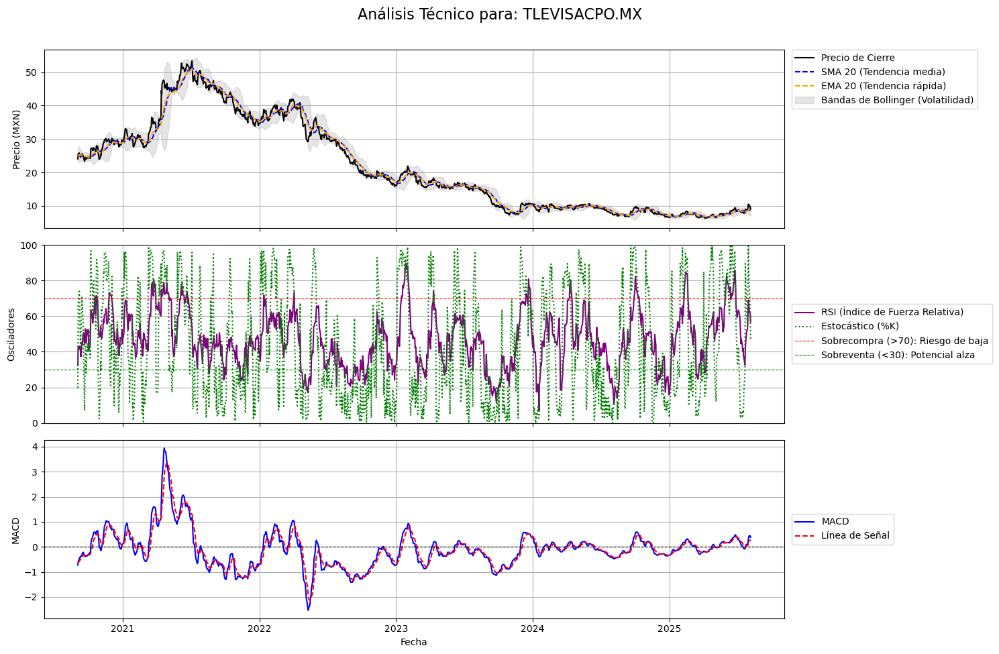

Procesando y graficando para GRUMAB.MX...


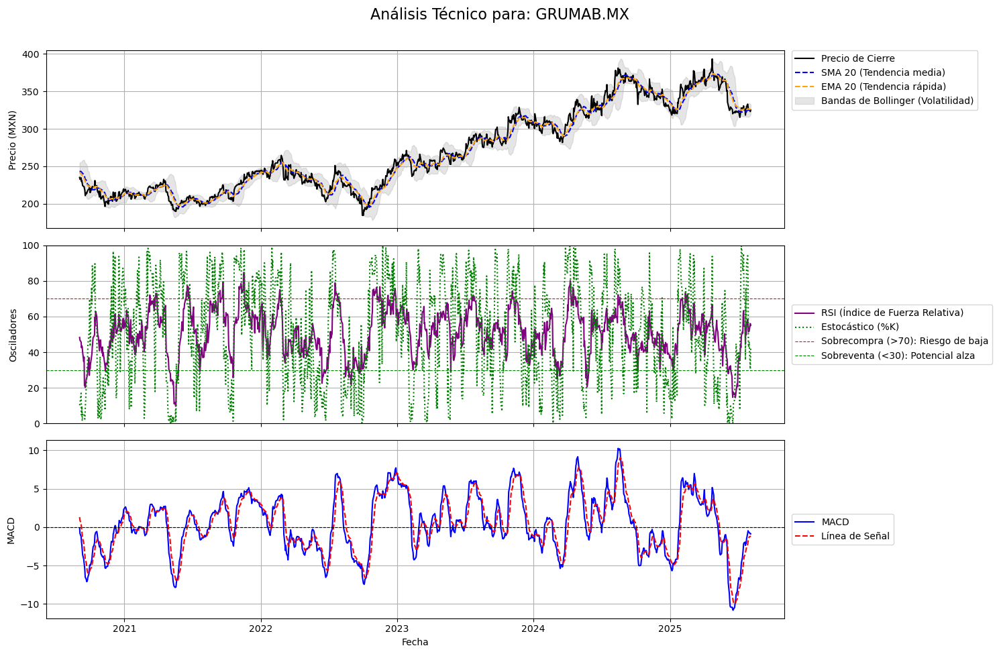

Procesando y graficando para GAPB.MX...


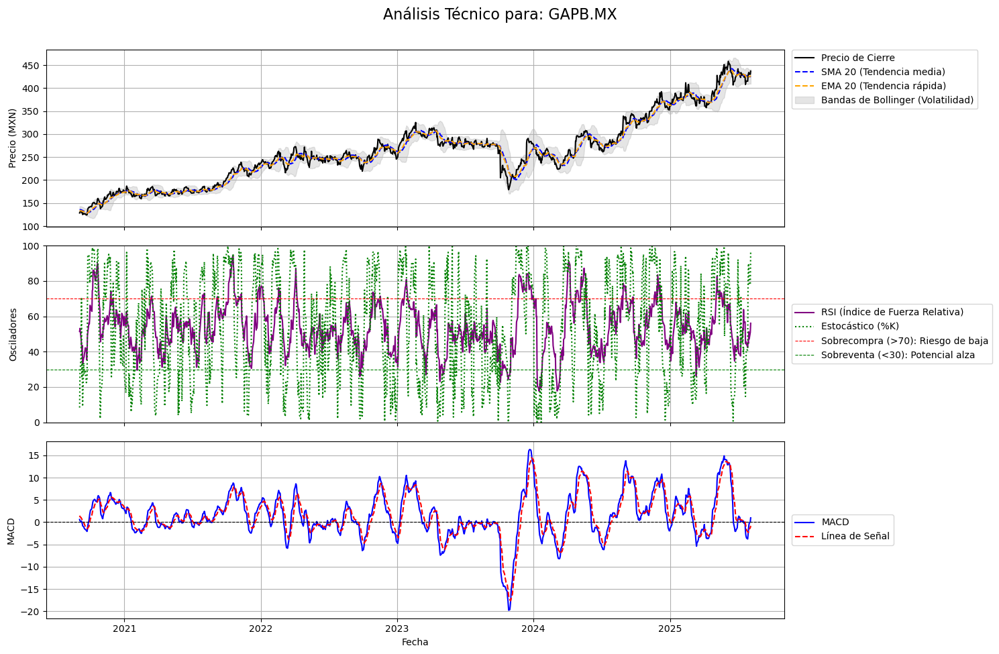

Procesando y graficando para ASURB.MX...


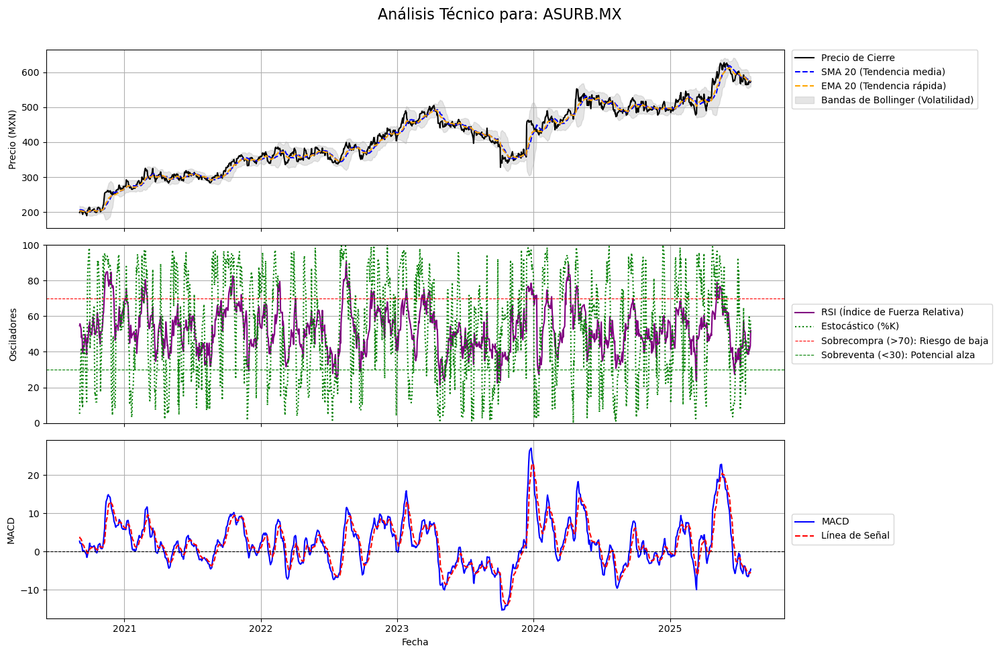

Procesando y graficando para ORBIA.MX...


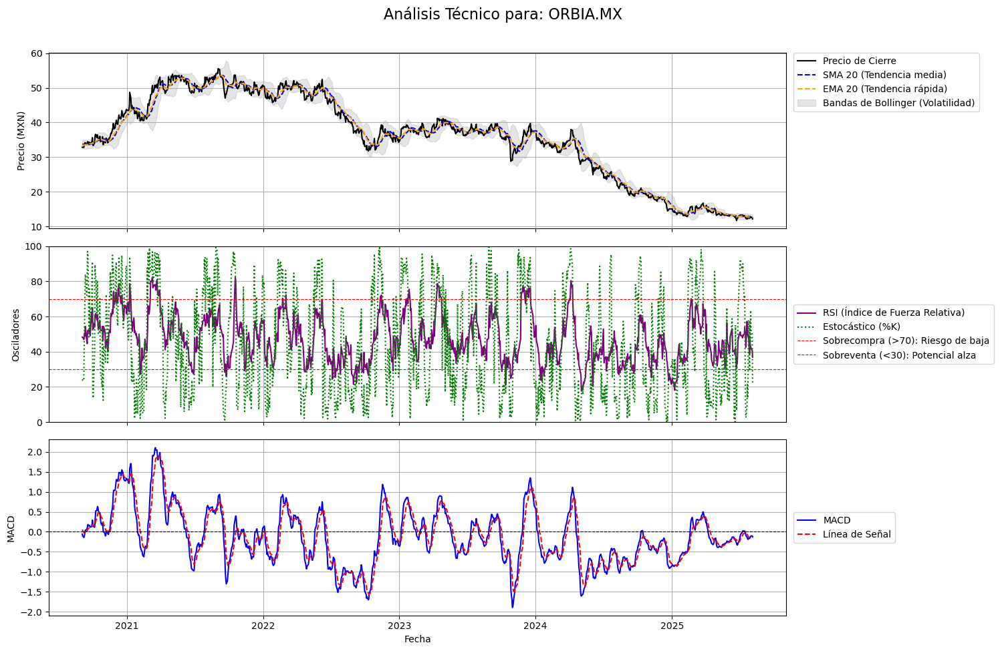

Procesando y graficando para PINFRA.MX...


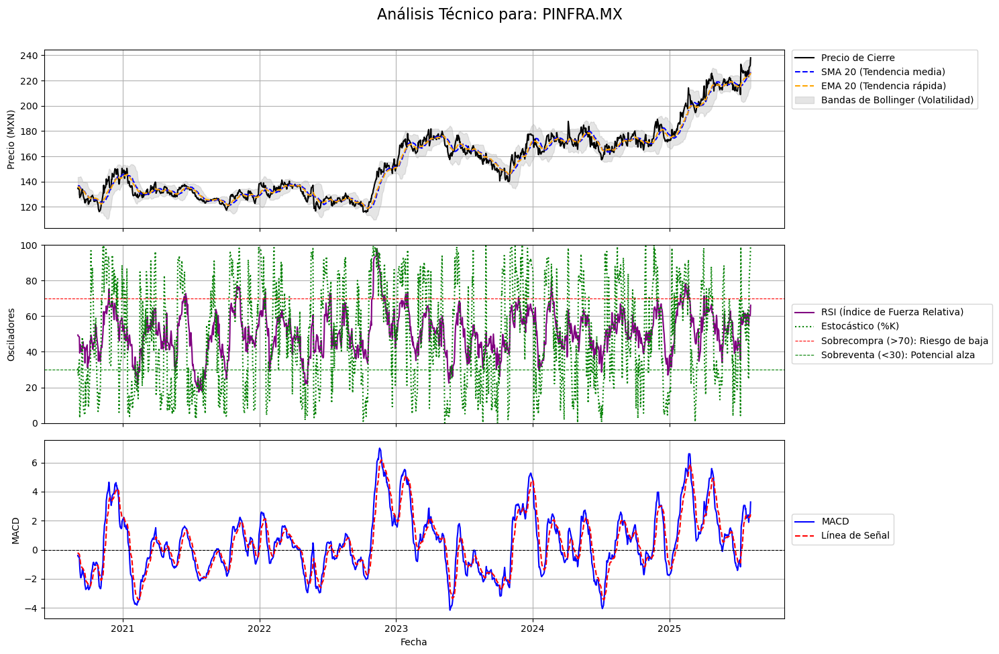

Procesando y graficando para AC.MX...


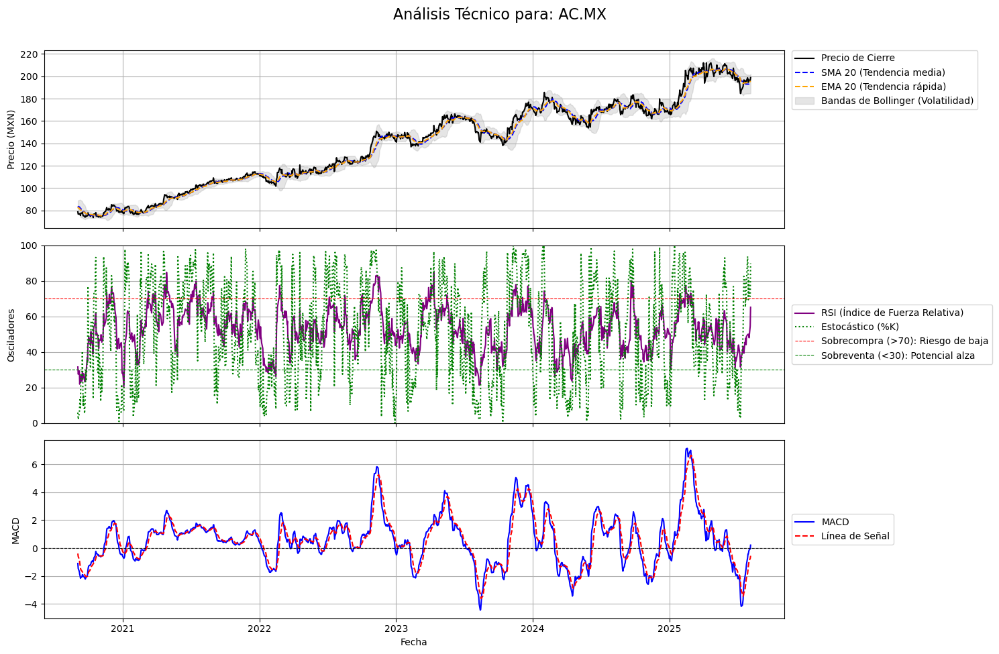

Procesando y graficando para KOFUBL.MX...


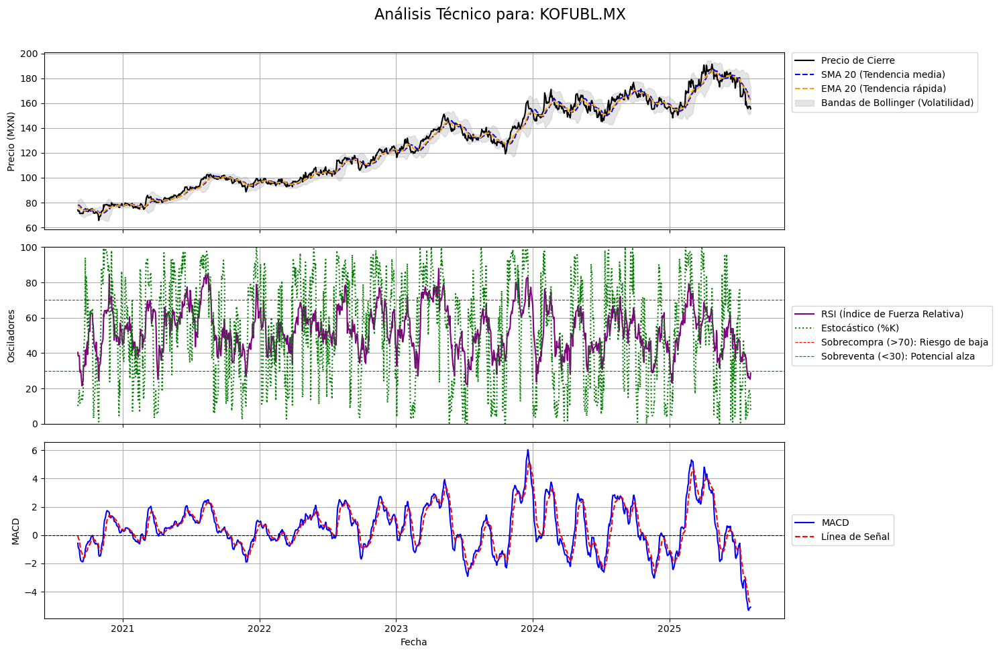

Procesando y graficando para ALPEKA.MX...


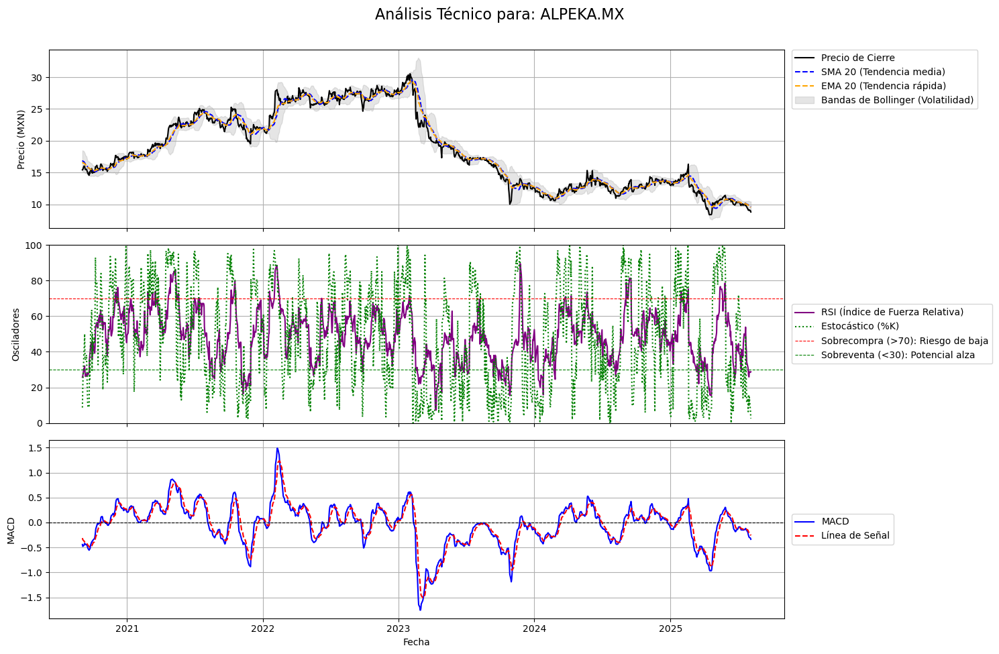

Procesando y graficando para KIMBERA.MX...


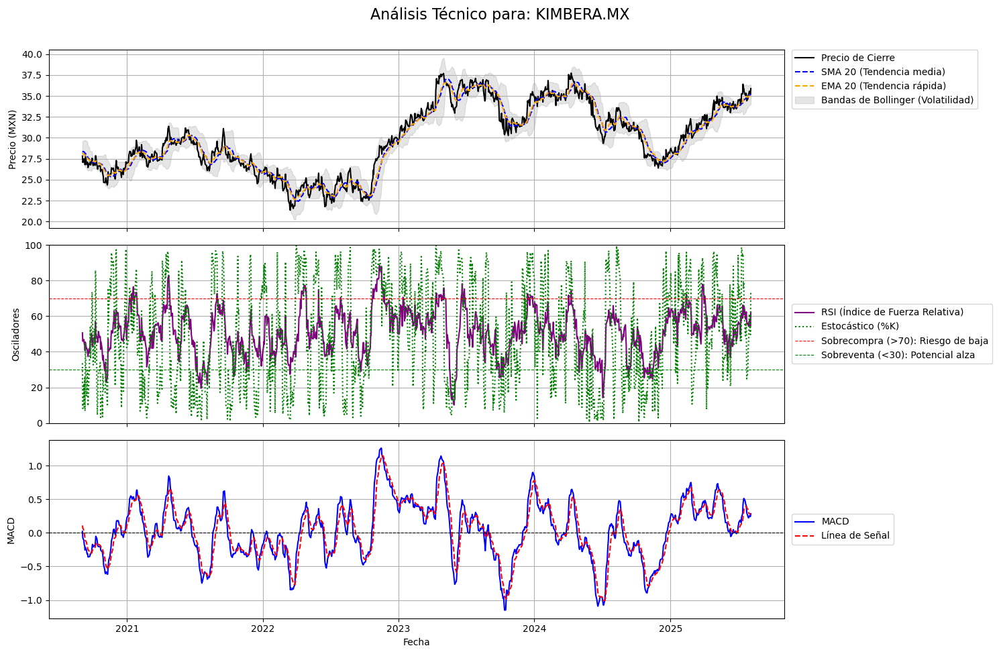

Procesando y graficando para BOLSAA.MX...


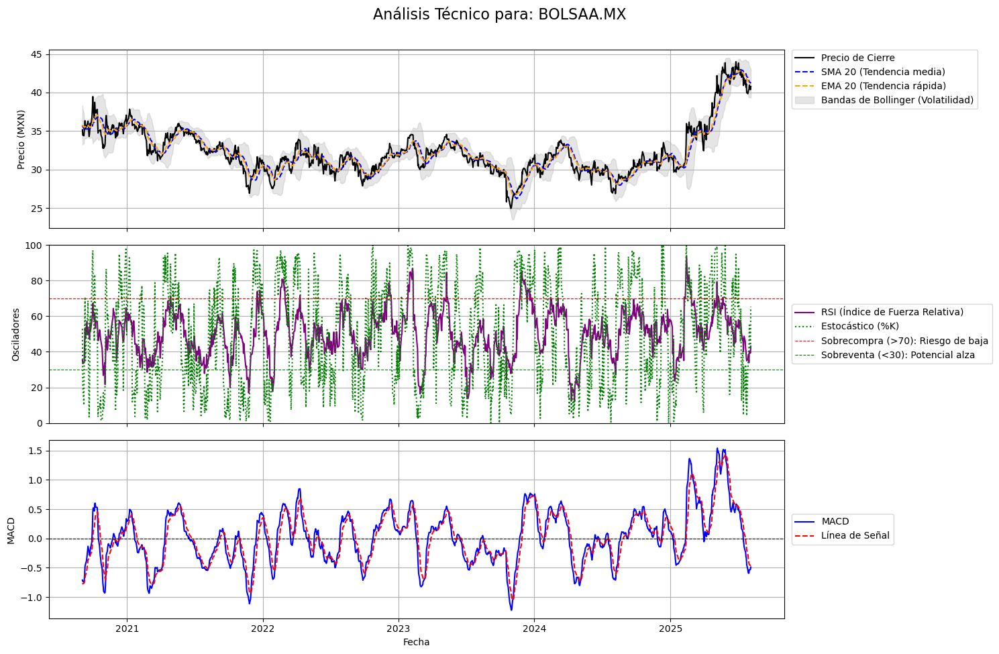

Procesando y graficando para LABB.MX...


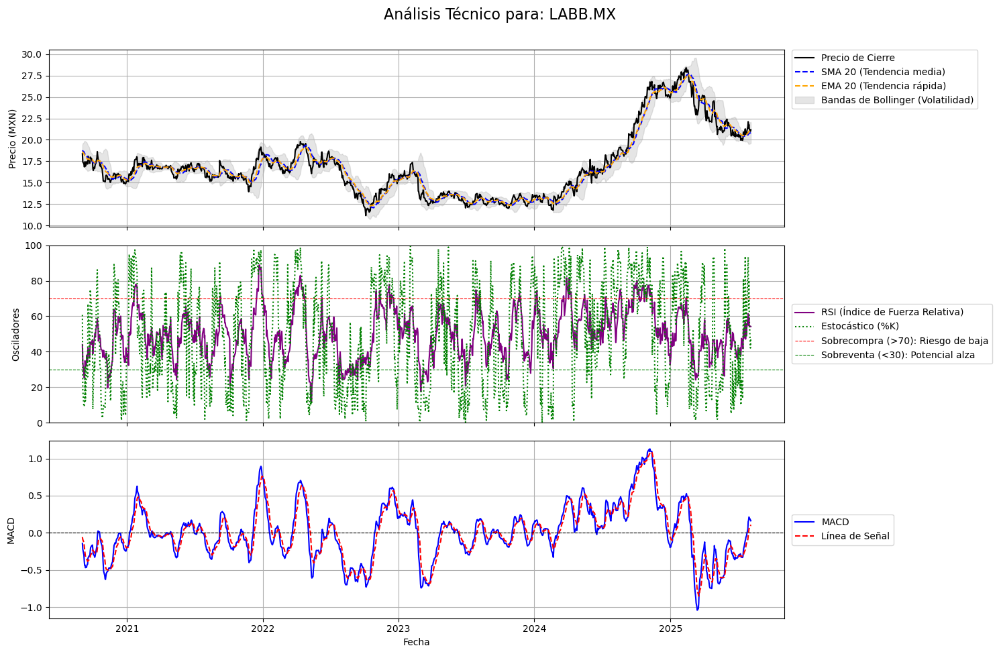

Procesando y graficando para GENTERA.MX...


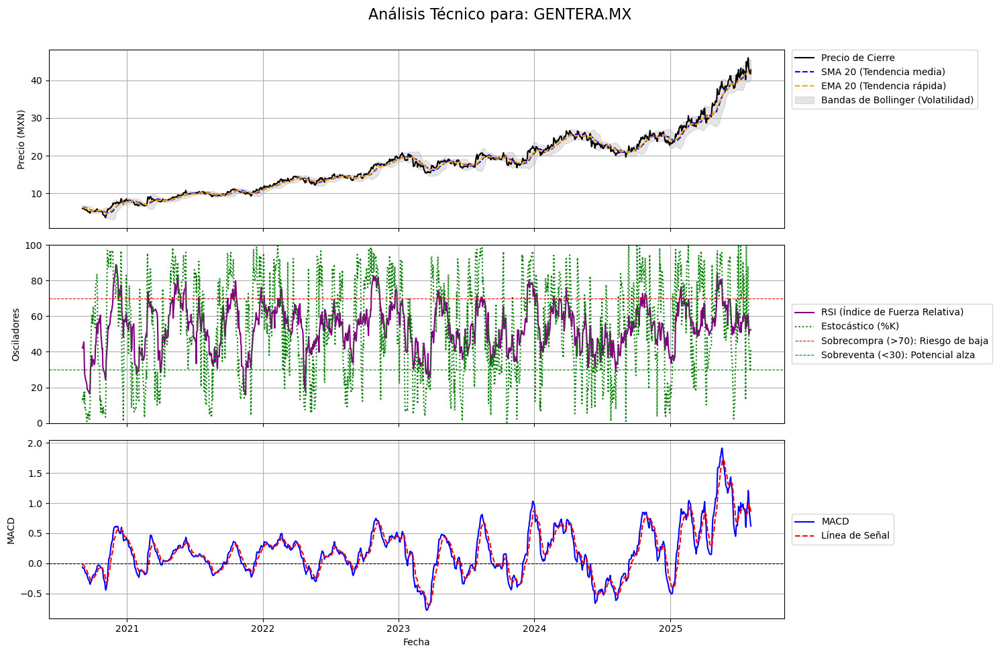

Procesando y graficando para MEGACPO.MX...


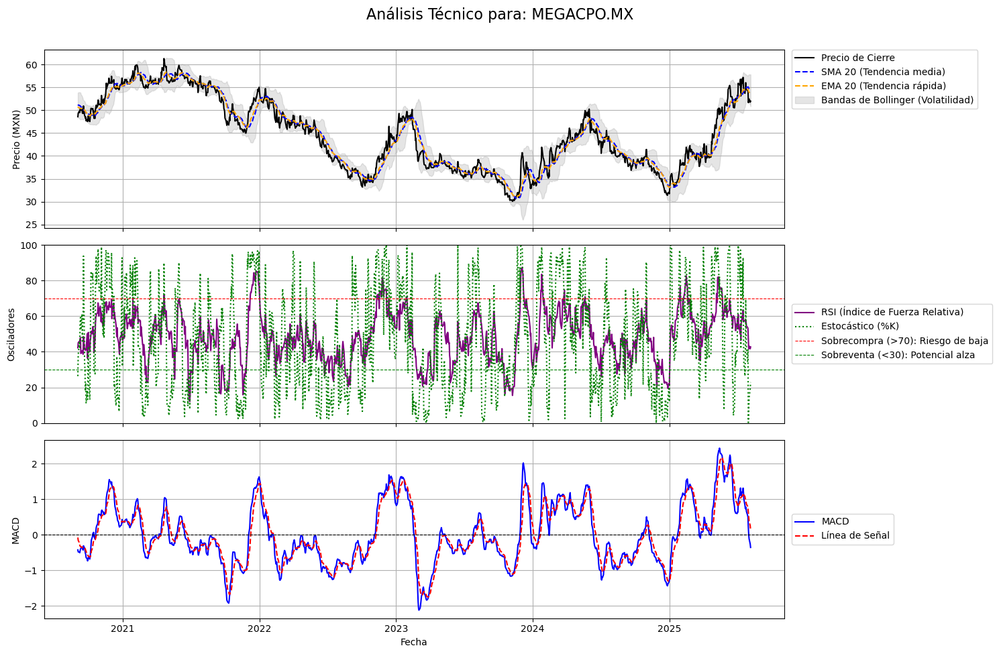

Procesando y graficando para LIVEPOLC-1.MX...


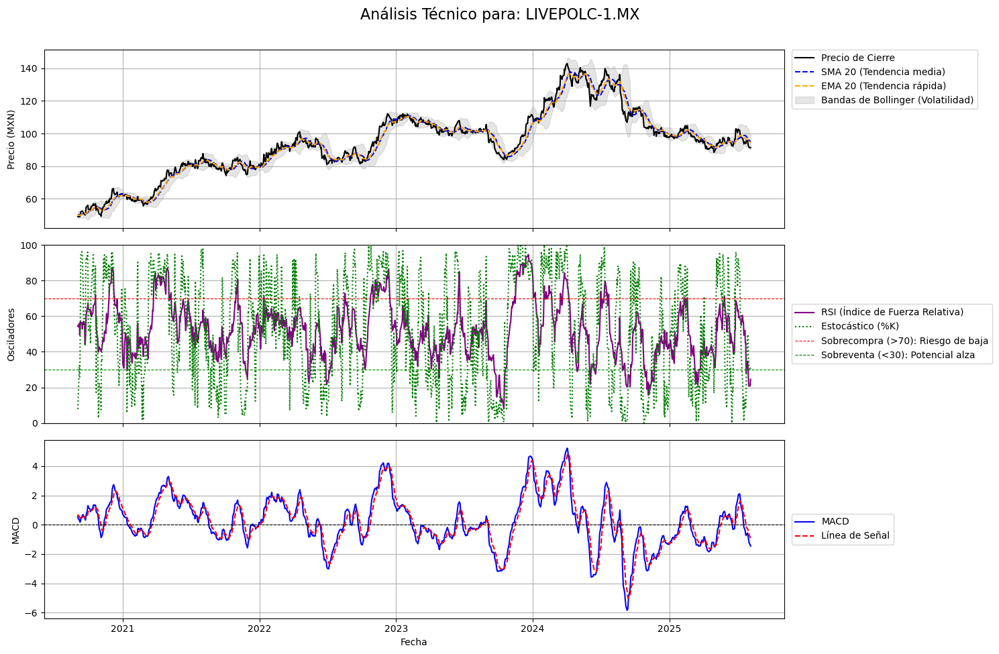

Procesando y graficando para BBAJIOO.MX...


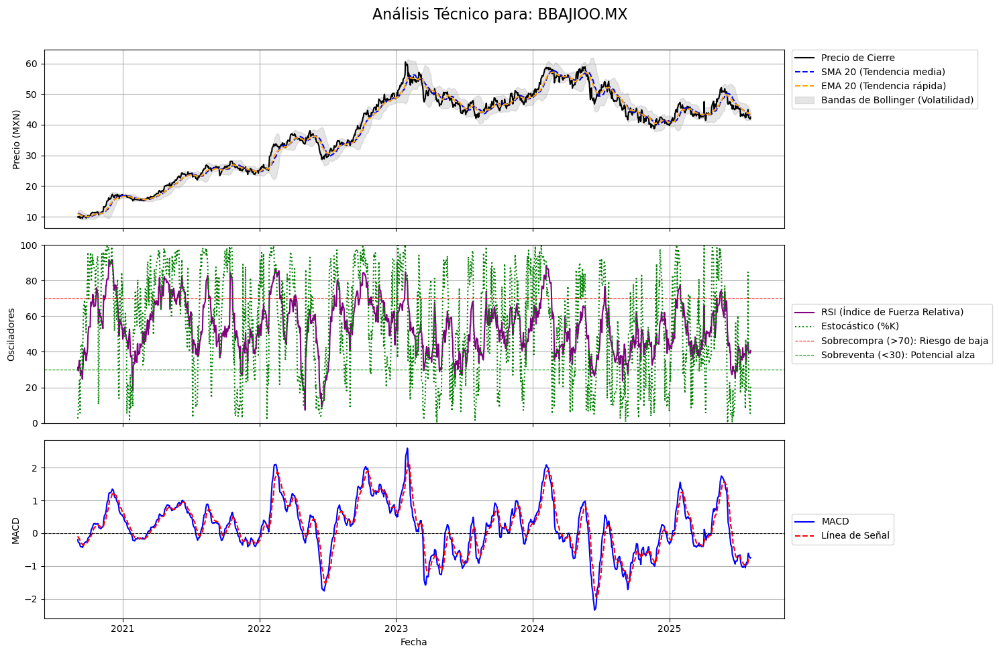

Procesando y graficando para GCARSOA1.MX...


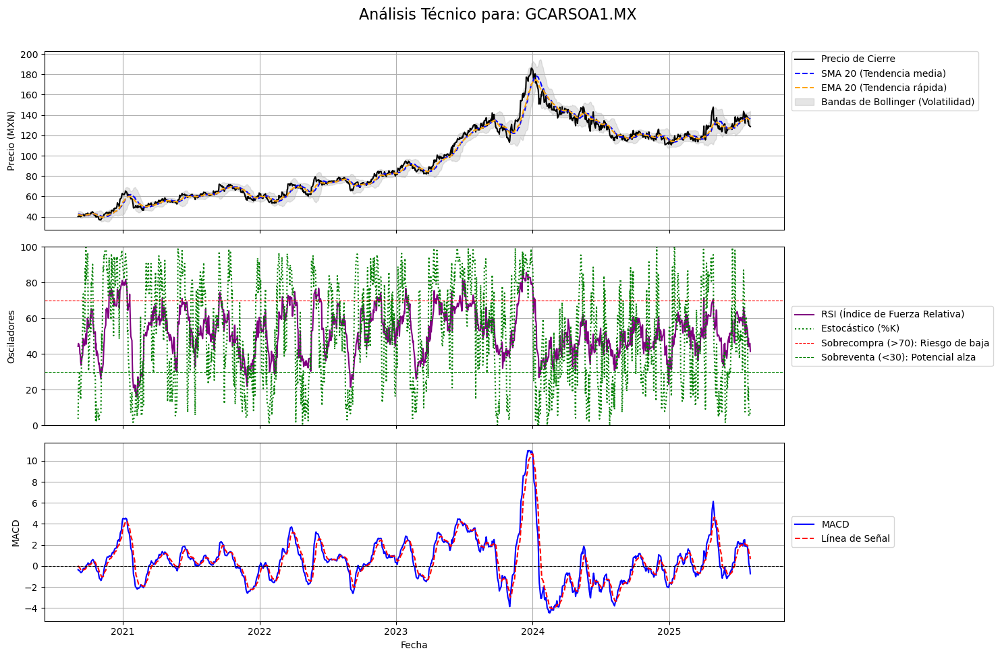

Procesando y graficando para RA.MX...


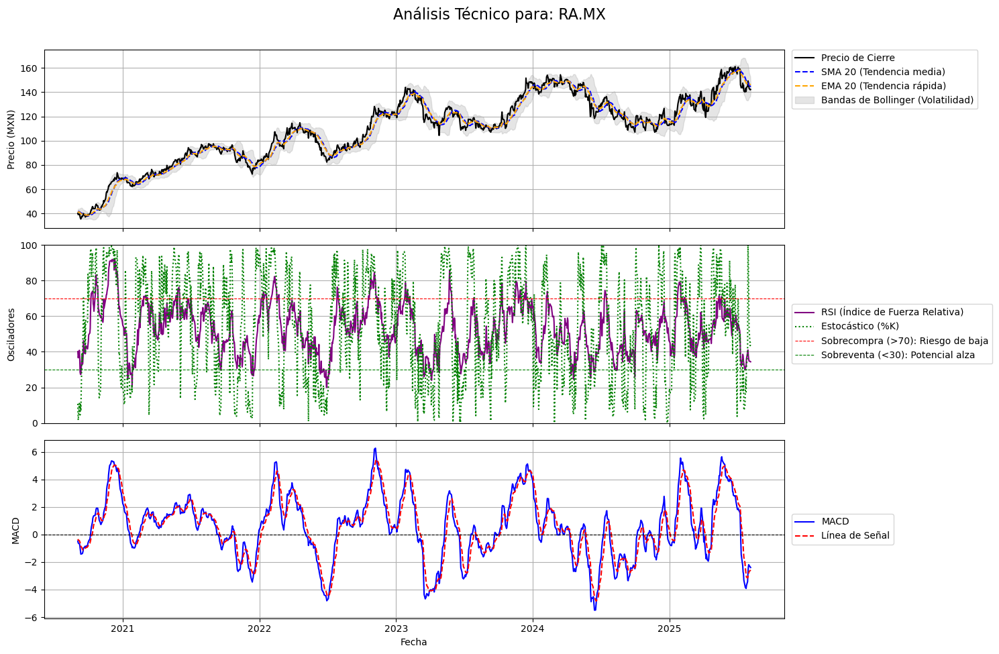

Procesando y graficando para CUERVO.MX...


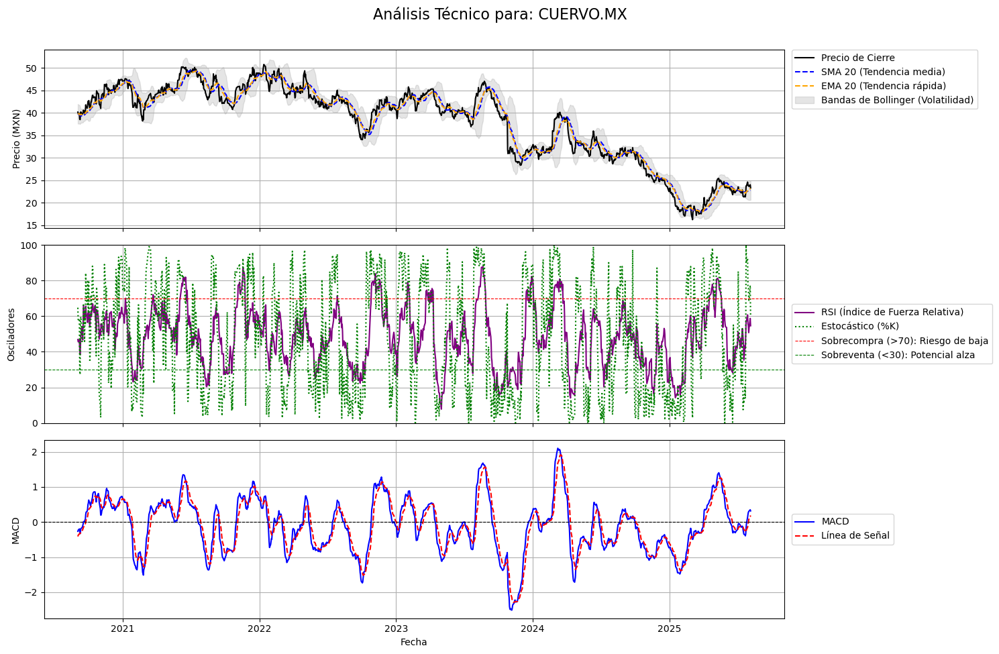

Procesando y graficando para ALFAA.MX...


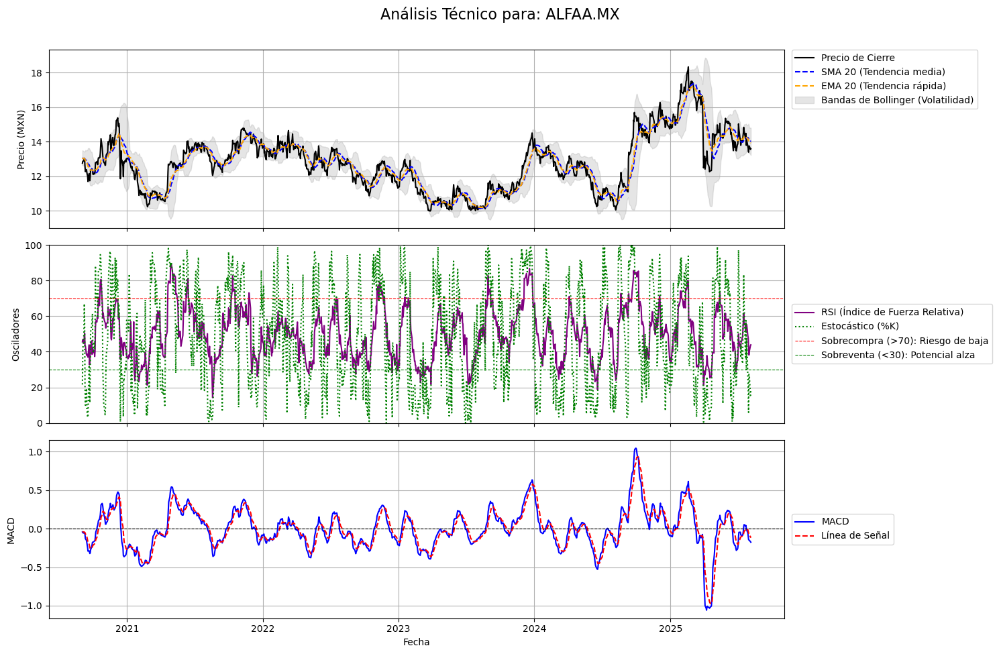

Procesando y graficando para VESTA.MX...


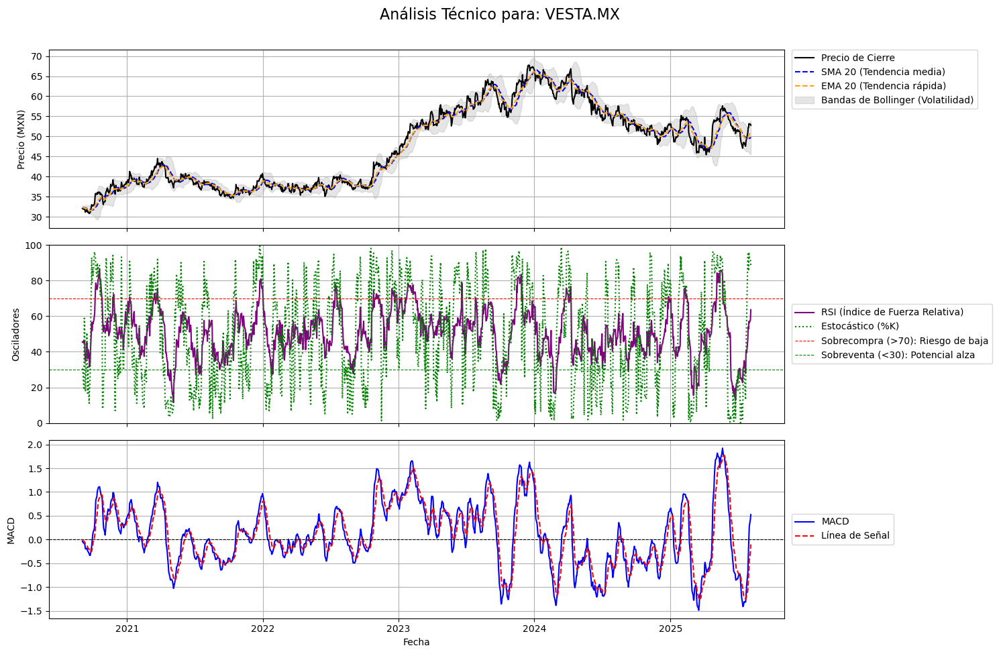

Procesando y graficando para GMXT.MX...


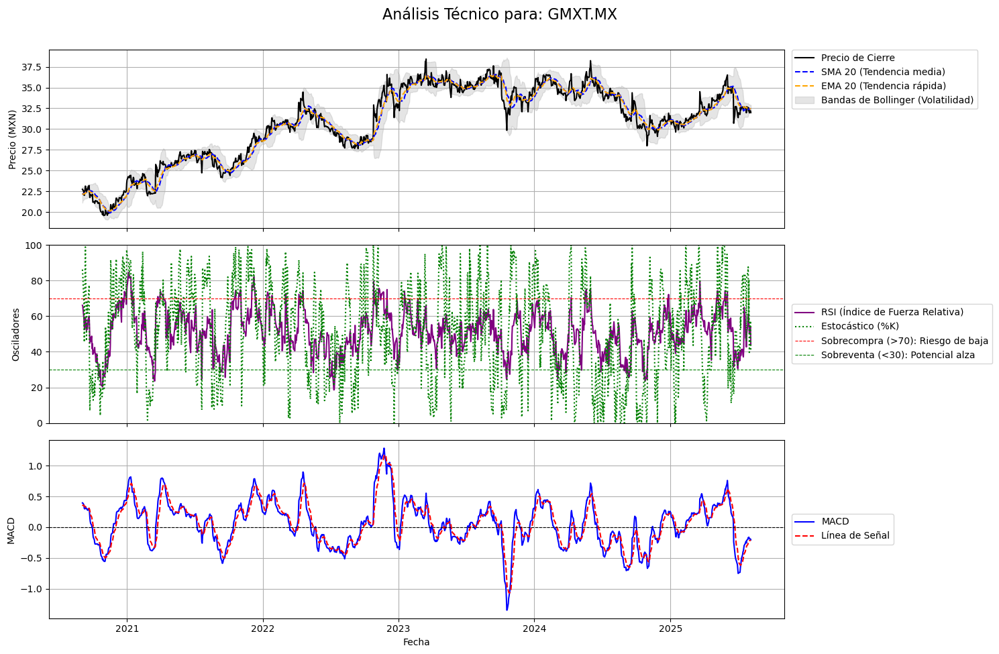


Generando gráficos macroeconómicos separados con indicadores técnicos...


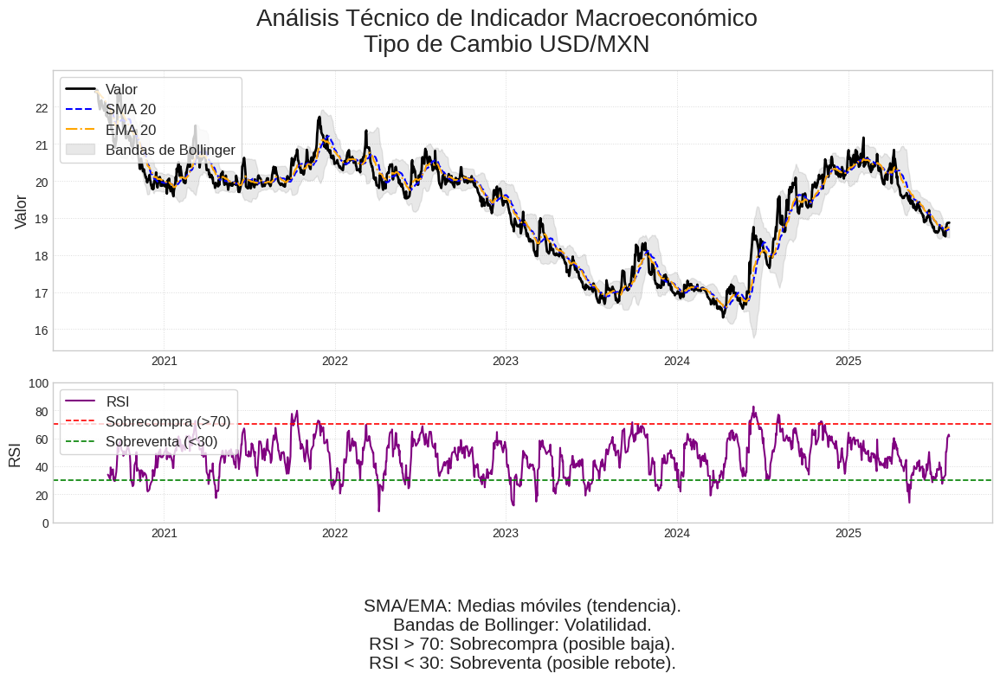

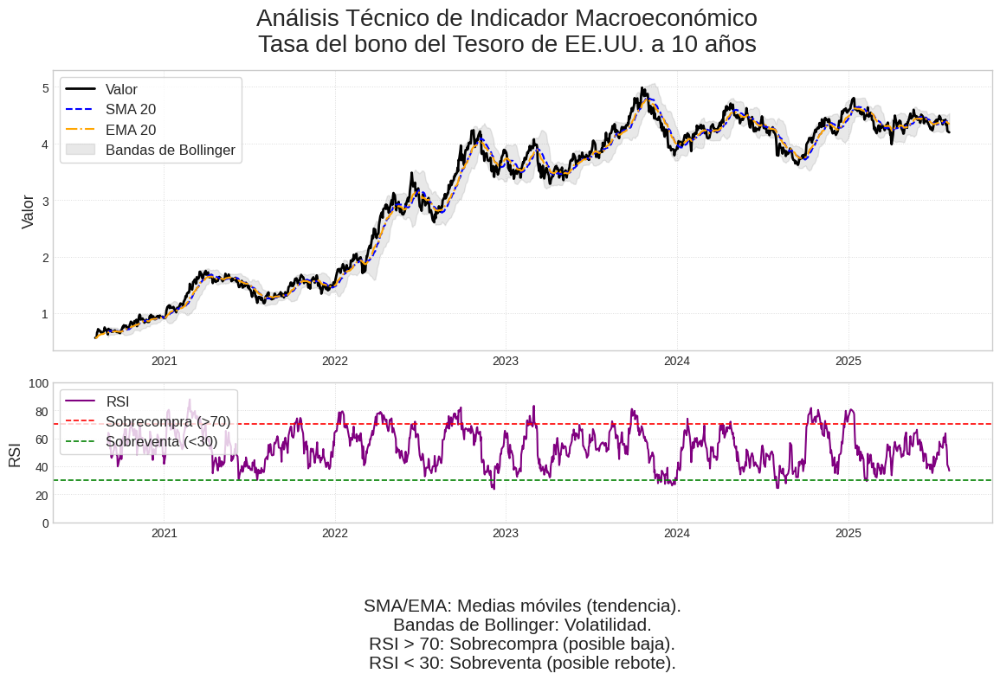

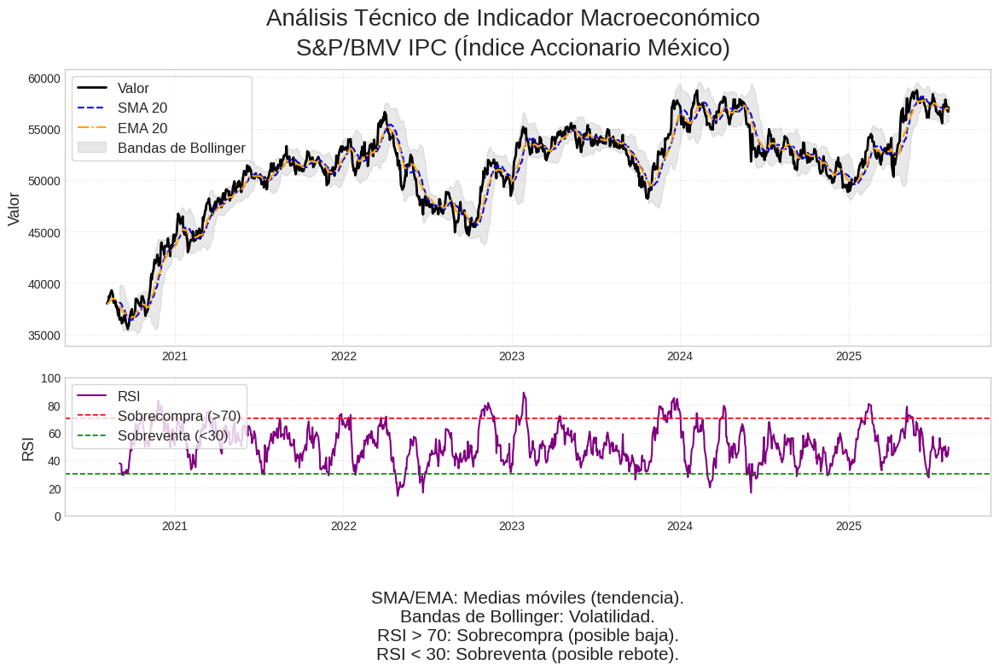

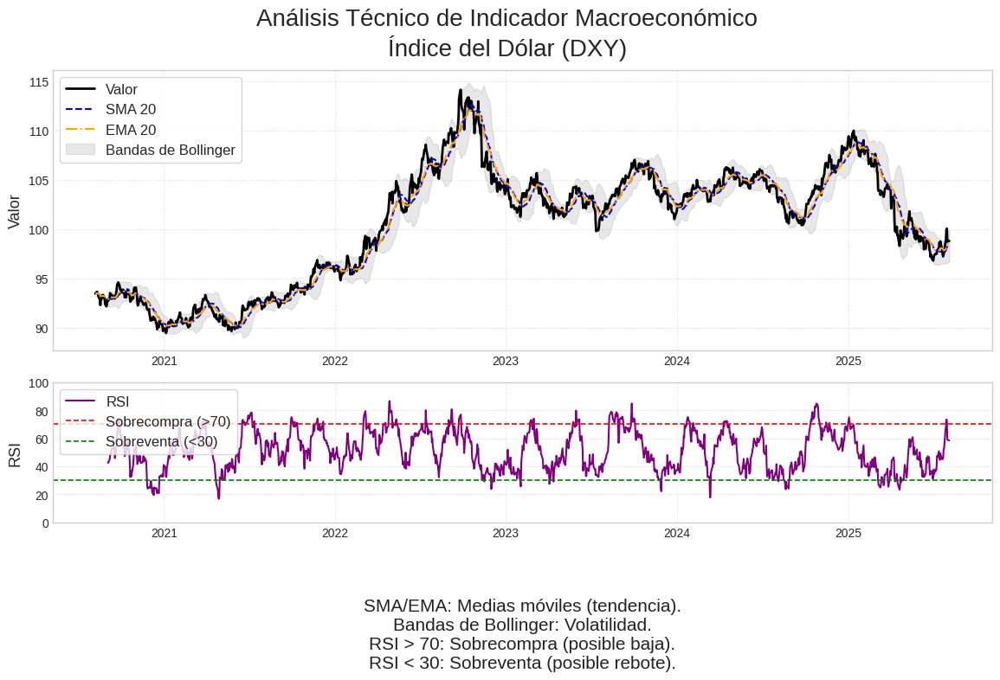

In [2]:
def generar_analisis_financiero_completo_mexico():
    """
    Script autocontenido que descarga, procesa y grafica datos financieros y macroeconómicos
    para una lista de tickers del mercado mexicano. Incluye análisis técnico para cada activo
    y para cada variable macroeconómica relevante.
    """
    import pandas as pd
    import yfinance as yf
    import numpy as np
    from datetime import date, timedelta
    import matplotlib.pyplot as plt

    # --- CONFIGURACIÓN DEL ANÁLISIS PARA EL MERCADO MEXICANO ---
    # Se utiliza una lista de tickers verificados del S&P/BMV IPC.
    TICKERS_A_ANALIZAR = [
        'WALMEX.MX', 'AMX.MX', 'GFNORTEO.MX', 'FEMSAUBD.MX', 'GMEXICOB.MX',
        'CEMEXCPO.MX', 'GFINBURO.MX', 'BIMBOA.MX', 'TLEVISACPO.MX',
        'GRUMAB.MX', 'GAPB.MX', 'ASURB.MX', 'ORBIA.MX', 'PINFRA.MX', 'AC.MX',
        'KOFUBL.MX', 'PEOLES.MX', 'ALPEKA.MX', 'KIMBERA.MX', 'BOLSAA.MX', 'LABB.MX',
        'GENTERA.MX', 'MEGACPO.MX', 'LIVEPOLC-1.MX', 'BBAJIOO.MX', 'GCARSOA1.MX',
        'RA.MX', 'CUERVO.MX', 'ALFAA.MX', 'VESTA.MX', 'GMXT.MX'
    ]
    
    # El benchmark principal para México es el Índice de Precios y Cotizaciones (IPC).
    BENCHMARK_TICKER = '^MXX'
    
    # Tickers macroeconómicos relevantes para el análisis del mercado mexicano.
    MACRO_TICKERS = ['^MXX', 'MXN=X', '^TNX', 'DX-Y.NYB', BENCHMARK_TICKER]
    
    end_date = date.today()
    start_date = end_date - timedelta(days=5*365)
    start_date_str = start_date.strftime('%Y-%m-%d')
    end_date_str = end_date.strftime('%Y-%m-%d')

    # --- FUNCIONES INTERNAS ---
    def add_technical_indicators(df, high_prices, low_prices, close_prices, ticker, window_size=20):
        df[f'{ticker}_Close'] = close_prices[ticker]
        df[f'{ticker}_SMA'] = close_prices[ticker].rolling(window=window_size).mean()
        df[f'{ticker}_EMA'] = close_prices[ticker].ewm(span=window_size, adjust=False).mean()
        bb_std = close_prices[ticker].rolling(window=window_size).std()
        df[f'{ticker}_BB_UPPER'] = df[f'{ticker}_SMA'] + (bb_std * 2)
        df[f'{ticker}_BB_LOWER'] = df[f'{ticker}_SMA'] - (bb_std * 2)
        delta = close_prices[ticker].diff(1)
        gain = (delta.where(delta > 0, 0)).rolling(window=window_size).mean()
        loss = (-delta.where(delta < 0, 0)).rolling(window=window_size).mean()
        rs = gain / loss.replace(0, 1e-9)
        df[f'{ticker}_RSI'] = 100 - (100 / (1 + rs))
        ema_12 = close_prices[ticker].ewm(span=12, adjust=False).mean()
        ema_26 = close_prices[ticker].ewm(span=26, adjust=False).mean()
        df[f'{ticker}_MACD'] = ema_12 - ema_26
        df[f'{ticker}_MACD_signal'] = df[f'{ticker}_MACD'].ewm(span=9, adjust=False).mean()
        low_14 = low_prices[ticker].rolling(window=14).min()
        high_14 = high_prices[ticker].rolling(window=14).max()
        divisor = (high_14 - low_14).replace(0, 1e-9)
        df[f'{ticker}_STOCH_K'] = 100 * ((close_prices[ticker] - low_14) / divisor)
        return df

    def plot_macro_with_indicators(macro, close_prices, window_size=20):
        import matplotlib.pyplot as plt
        import pandas as pd

        # Diccionario de descripciones para cada ticker macroeconómico.
        macro_desc = {
            '^MXX': 'S&P/BMV IPC (Índice Accionario México)',
            'MXN=X': 'Tipo de Cambio USD/MXN',
            '^TNX': 'Tasa del bono del Tesoro de EE.UU. a 10 años',
            'DX-Y.NYB': 'Índice del Dólar (DXY)',
            '^GSPC': 'S&P 500 (Referencia EE.UU.)'
        }
        desc = macro_desc.get(macro, macro)

        series = close_prices[macro].copy()
        df = pd.DataFrame(index=series.index)
        df[f'{macro}_Close'] = series
        df[f'{macro}_SMA'] = series.rolling(window=window_size).mean()
        df[f'{macro}_EMA'] = series.ewm(span=window_size, adjust=False).mean()
        bb_std = series.rolling(window=window_size).std()
        df[f'{macro}_BB_UPPER'] = df[f'{macro}_SMA'] + (bb_std * 2)
        df[f'{macro}_BB_LOWER'] = df[f'{macro}_SMA'] - (bb_std * 2)
        delta = series.diff(1)
        gain = (delta.where(delta > 0, 0)).rolling(window=window_size).mean()
        loss = (-delta.where(delta < 0, 0)).rolling(window=window_size).mean()
        rs = gain / loss.replace(0, 1e-9)
        df[f'{macro}_RSI'] = 100 - (100 / (1 + rs))

        plt.style.use('seaborn-v0_8-whitegrid')
        fig = plt.figure(figsize=(14, 9))
        gs = fig.add_gridspec(4, 1, height_ratios=[2, 1, 0.1, 0.5], hspace=0.25)
        ax1 = fig.add_subplot(gs[0])
        ax2 = fig.add_subplot(gs[1], sharex=ax1)
        ax_leyenda = fig.add_subplot(gs[3])

        titulo = f'Análisis Técnico de Indicador Macroeconómico\n{desc}'
        fig.suptitle(titulo, fontsize=20, y=0.96)

        ax1.plot(df.index, df[f'{macro}_Close'], label='Valor', color='black', linewidth=2)
        ax1.plot(df.index, df[f'{macro}_SMA'], label='SMA 20', color='blue', linestyle='--', linewidth=1.5)
        ax1.plot(df.index, df[f'{macro}_EMA'], label='EMA 20', color='orange', linestyle='-.', linewidth=1.5)
        ax1.fill_between(df.index, df[f'{macro}_BB_LOWER'], df[f'{macro}_BB_UPPER'], color='gray', alpha=0.18, label='Bandas de Bollinger')
        ax1.set_ylabel('Valor', fontsize=13)
        ax1.legend(loc='upper left', fontsize=12, frameon=True)
        ax1.grid(True, which='both', linestyle=':', linewidth=0.7, alpha=0.7)

        ax2.plot(df.index, df[f'{macro}_RSI'], label='RSI', color='purple', linewidth=1.5)
        ax2.axhline(70, color='red', linestyle='--', linewidth=1.2, label='Sobrecompra (>70)')
        ax2.axhline(30, color='green', linestyle='--', linewidth=1.2, label='Sobreventa (<30)')
        ax2.set_ylabel('RSI', fontsize=13)
        ax2.set_ylim(0, 100)
        ax2.legend(loc='upper left', fontsize=12, frameon=True)
        ax2.grid(True, which='both', linestyle=':', linewidth=0.7, alpha=0.7)

        ax_leyenda.axis('off')
        leyenda = (
            "SMA/EMA: Medias móviles (tendencia).\n"
            "Bandas de Bollinger: Volatilidad.\n"
            "RSI > 70: Sobrecompra (posible baja).\n"
            "RSI < 30: Sobreventa (posible rebote)."
        )
        ax_leyenda.text(0.5, 0.5, leyenda, fontsize=15, ha='center', va='center', wrap=True, color='#222222')

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    # --- PASO 1: INGESTA DE DATOS ---
    ALL_TICKERS_TO_DOWNLOAD = list(set(TICKERS_A_ANALIZAR + MACRO_TICKERS))
    print(f"Descargando datos históricos (OHLC) de {start_date_str} a {end_date_str}...")
    full_data = yf.download(ALL_TICKERS_TO_DOWNLOAD, start=start_date_str, end=end_date_str, progress=True, group_by='ticker')
    if full_data.empty:
        print("Error: No se pudieron descargar los datos. Verifique la conexión a internet o los tickers.")
        return
    print("Descarga completada.")
    full_data.interpolate(method='linear', limit_direction='both', inplace=True)
    DOWNLOADED_TICKERS = [t for t in ALL_TICKERS_TO_DOWNLOAD if t in full_data.columns.get_level_values(0) and not full_data[t]['Close'].isnull().all()]
    VALID_TICKERS = [t for t in TICKERS_A_ANALIZAR if t in DOWNLOADED_TICKERS]
    print(f"Se encontraron {len(VALID_TICKERS)} tickers válidos para procesar.")

    close_prices = pd.concat({ticker: full_data[ticker]['Close'] for ticker in DOWNLOADED_TICKERS}, axis=1)
    high_prices = pd.concat({ticker: full_data[ticker]['High'] for ticker in DOWNLOADED_TICKERS}, axis=1)
    low_prices = pd.concat({ticker: full_data[ticker]['Low'] for ticker in DOWNLOADED_TICKERS}, axis=1)
    print(f"\nDataFrame de precios de cierre procesado con dimensiones: {close_prices.shape}")

    # --- PASO 2: GRÁFICOS DE SERIES DE TIEMPO POR TICKER ---
    if not close_prices.empty:
        print("\nGenerando gráficos de series de tiempo por cada activo...")
        macro_df = close_prices[[t for t in MACRO_TICKERS if t in close_prices.columns]].copy()

        for ticker in VALID_TICKERS:
            print(f"Procesando y graficando para {ticker}...")
            features_df = pd.DataFrame(index=close_prices.index)
            features_df = add_technical_indicators(features_df, high_prices, low_prices, close_prices, ticker)
            features_df = features_df.join(macro_df)
            features_df.dropna(inplace=True)

            if features_df.empty:
                print(f"No hay suficientes datos para graficar {ticker} después del preprocesamiento.")
                continue

            fig, axes = plt.subplots(3, 1, figsize=(15, 10), sharex=True)
            fig.suptitle(f'Análisis Técnico para: {ticker}', fontsize=16, y=0.97)

            ax1 = axes[0]
            ax1.plot(features_df.index, features_df[f'{ticker}_Close'], label='Precio de Cierre', color='black')
            ax1.plot(features_df.index, features_df[f'{ticker}_SMA'], label='SMA 20 (Tendencia media)', color='blue', linestyle='--')
            ax1.plot(features_df.index, features_df[f'{ticker}_EMA'], label='EMA 20 (Tendencia rápida)', color='orange', linestyle='--')
            ax1.fill_between(features_df.index, features_df[f'{ticker}_BB_LOWER'], features_df[f'{ticker}_BB_UPPER'], color='gray', alpha=0.2, label='Bandas de Bollinger (Volatilidad)')
            ax1.set_ylabel('Precio (MXN)')
            ax1.legend(loc='upper left', bbox_to_anchor=(1.01, 1), borderaxespad=0.)
            ax1.grid(True)

            ax2 = axes[1]
            ax2.plot(features_df.index, features_df[f'{ticker}_RSI'], label='RSI (Índice de Fuerza Relativa)', color='purple')
            ax2.plot(features_df.index, features_df[f'{ticker}_STOCH_K'], label='Estocástico (%K)', color='green', linestyle=':')
            ax2.axhline(70, color='red', linestyle='--', linewidth=0.8, label='Sobrecompra (>70): Riesgo de baja')
            ax2.axhline(30, color='green', linestyle='--', linewidth=0.8, label='Sobreventa (<30): Potencial alza')
            ax2.set_ylabel('Osciladores')
            ax2.set_ylim(0, 100)
            ax2.legend(loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
            ax2.grid(True)

            ax3 = axes[2]
            ax3.plot(features_df.index, features_df[f'{ticker}_MACD'], label='MACD', color='blue')
            ax3.plot(features_df.index, features_df[f'{ticker}_MACD_signal'], label='Línea de Señal', color='red', linestyle='--')
            ax3.axhline(0, color='black', linestyle='--', linewidth=0.8)
            ax3.set_ylabel('MACD')
            ax3.legend(loc='center left', bbox_to_anchor=(1.01, 0.5), borderaxespad=0.)
            ax3.grid(True)

            axes[-1].set_xlabel('Fecha')
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            plt.show()

        print("\nGenerando gráficos macroeconómicos separados con indicadores técnicos...")
        for macro in set(MACRO_TICKERS): # Usamos set para no repetir el benchmark
            if macro in close_prices.columns:
                plot_macro_with_indicators(macro, close_prices)
    else:
        print("El DataFrame 'close_prices' está vacío. No se pueden generar gráficos.")

# --- PUNTO DE ENTRADA PARA LA EJECUCIÓN ---
if __name__ == "__main__":
    generar_analisis_financiero_completo_mexico()

In [ ]:
# --- CONFIGURACIÓN DEL ANÁLISIS PARA EL MERCADO MEXICANO ---

# ## CORRECCIÓN CLAVE ##
# Se actualizó la lista a los componentes principales y verificados del S&P/BMV IPC para evitar errores de descarga.
TICKERS_A_ANALIZAR = [
    'WALMEX.MX', 'AMX.MX', 'GFNORTEO.MX', 'FEMSAUBD.MX', 'GMEXICOB.MX', 
    'CEMEXCPO.MX', 'GFINBURO.MX', 'BIMBOA.MX', 'TLEVISACPO.MX',
    'GRUMAB.MX', 'GAPB.MX', 'ASURB.MX', 'ORBIA.MX', 'PINFRA.MX', 'AC.MX',
    'KOFUBL.MX', 'PEOLES.MX', 'ALPEKA.MX', 'KIMBERA.MX', 'BOLSAA.MX', 'LABB.MX',
    'GENTERA.MX', 'MEGACPO.MX', 'LIVEPOLC-1.MX', 'BBAJIOO.MX', 'GCARSOA1.MX',
    'RA.MX', 'CUERVO.MX', 'ALFAA.MX', 'VESTA.MX', 'GMXT.MX'
]

# Ticker para el Índice de Precios y Cotizaciones (IPC). 
# Es el principal indicador del mercado de valores mexicano, representando a las empresas más grandes y líquidas.
ipc_ticker = '^MXX'

# Ticker para el tipo de cambio del dólar estadounidense (USD) al peso mexicano (MXN).
exchange_rate_ticker = 'MXN=X'

# Ticker de referencia (benchmark) para el mercado de valores de EE. UU.
# Se utiliza el S&P 500, que agrupa a las 500 empresas más grandes de ese país y sirve como un termómetro de la economía global.
BENCHMARK_TICKER = '^GSPC'

# Lista que contiene los tickers de varios indicadores macroeconómicos clave para el análisis financiero.
MACRO_TICKERS = [
    '^MXX',           # IPC de México: Desempeño del mercado accionario local.
    'MXN=X',          # Tipo de cambio USD/MXN: Valor del peso frente al dólar.
    '^TNX',           # Rendimiento del Bono del Tesoro de EE.UU. a 10 años: Referencia para tasas de interés a largo plazo.
    'DX-Y.NYB',       # U.S. Dollar Index (DXY): Fortaleza del dólar frente a una canasta de monedas globales.
    BENCHMARK_TICKER  # S&P 500: Rendimiento del mercado de referencia (EE.UU.).
]
N_FORECAST_DAYS = 30
N_OPTUNA_TRIALS = 70
N_SPLITS_CV = 5
ARTIFACTS_DIR = "artifacts"
n_epochs = 100 # Número de épocas para el entrenamiento del modelo LSTM.

In [ ]:
# =============================================================================
# SECCIÓN 1: DEFINICIÓN DE CLASES Y FUNCIONES AUXILIARES
# =============================================================================

def add_technical_indicators(df, close_prices, ticker, window_size=20):
    df[f'{ticker}_Close'] = close_prices[ticker]
    df[f'{ticker}_SMA'] = close_prices[ticker].rolling(window=window_size).mean()
    df[f'{ticker}_EMA'] = close_prices[ticker].ewm(span=window_size, adjust=False).mean()
    bb_std = close_prices[ticker].rolling(window=window_size).std()
    df[f'{ticker}_BB_UPPER'] = df[f'{ticker}_SMA'] + (bb_std * 2)
    df[f'{ticker}_BB_LOWER'] = df[f'{ticker}_SMA'] - (bb_std * 2)
    delta = close_prices[ticker].diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=window_size).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window_size).mean()
    rs = gain / loss.replace(0, 1e-9)
    df[f'{ticker}_RSI'] = 100 - (100 / (1 + rs))
    ema_12 = close_prices[ticker].ewm(span=12, adjust=False).mean()
    ema_26 = close_prices[ticker].ewm(span=26, adjust=False).mean()
    df[f'{ticker}_MACD'] = ema_12 - ema_26
    df[f'{ticker}_MACD_signal'] = df[f'{ticker}_MACD'].ewm(span=9, adjust=False).mean()
    return df

def create_multivariate_sequences(data, window_size):
    X, y = [], []
    if len(data) <= window_size:
        return np.array(X), np.array(y)
    for i in range(len(data) - window_size):
        X.append(data[i:(i + window_size)])
        y.append(data[i + window_size, 0])
    return np.array(X), np.array(y).reshape(-1, 1)

def inverse_transform_preds(preds_scaled, scaler, num_features):
    dummy_array = np.zeros((len(preds_scaled), num_features))
    dummy_array[:, 0] = preds_scaled
    preds_inv = scaler.inverse_transform(dummy_array)[:, 0]
    return preds_inv


In [5]:
# --- Clases de Modelos LSTM ---
class SimpleLSTM(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(SimpleLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        h_lstm, _ = self.lstm(x)
        output = self.fc(h_lstm[:, -1, :])
        return output

class StackedLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, dropout):
        super(StackedLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=num_layers, 
                            dropout=dropout, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        h_lstm, _ = self.lstm(x)
        output = self.fc(h_lstm[:, -1, :])
        return output

In [6]:
# =============================================================================
# SECCIÓN 2: DESCARGA Y PREPARACIÓN DE DATOS
# =============================================================================
start_date = (date.today() - timedelta(days=5*365)).strftime('%Y-%m-%d')
end_date = date.today().strftime('%Y-%m-%d')

ALL_TICKERS_TO_DOWNLOAD = list(set(TICKERS_A_ANALIZAR + MACRO_TICKERS))
print(f"Descargando datos históricos de {start_date} a {end_date}...")
full_data = yf.download(ALL_TICKERS_TO_DOWNLOAD, start=start_date, end=end_date, progress=False, group_by='ticker')
print("Descarga completada.")

# --- PREPROCESAMIENTO ROBUSTO DE DATOS DE SERIES DE TIEMPO ---
full_data.interpolate(method='linear', limit_direction='both', inplace=True)

DOWNLOADED_TICKERS = [t for t in ALL_TICKERS_TO_DOWNLOAD if t in full_data.columns.get_level_values(0) and not full_data[t]['Close'].isnull().all()]
VALID_TICKERS = [t for t in TICKERS_A_ANALIZAR if t in DOWNLOADED_TICKERS]

close_prices = pd.concat({ticker: full_data[ticker]['Close'] for ticker in DOWNLOADED_TICKERS}, axis=1)

# Interpolación y forward/backward fill para cada DataFrame
close_prices = close_prices.interpolate(method='linear', limit_direction='both').fillna(method='ffill').fillna(method='bfill')
close_prices = close_prices.dropna(axis=0, how='any')

# --- FILTRO DE MULTICOLINEALIDAD POR CORRELACIÓN ---
CORR_THRESHOLD = 0.95
columns_to_remove = set()
if len(VALID_TICKERS) > 1:
    print(f"\n--- Aplicando filtro de correlación (umbral > {CORR_THRESHOLD}) ---")
    existing_tickers_for_corr = [t for t in VALID_TICKERS if t in close_prices.columns]
    correlation_matrix = close_prices[existing_tickers_for_corr].corr()
    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > CORR_THRESHOLD:
                col_to_remove = correlation_matrix.columns[i]
                columns_to_remove.add(col_to_remove)
    if columns_to_remove:
        print(f"Tickers eliminados por alta correlación: {sorted(list(columns_to_remove))}")
    else:
        print("No se encontraron tickers con correlación superior al umbral.")
else:
    print("No hay suficientes tickers para el análisis de correlación. Saltando este paso.")

# La lista final de tickers a procesar es la lista descargada MENOS los altamente correlacionados
VALID_TICKERS = [t for t in VALID_TICKERS if t not in columns_to_remove]


print(f"Se procesarán {len(VALID_TICKERS)} tickers válidos después del filtrado.")

Descargando datos históricos de 2020-08-07 a 2025-08-06...



2 Failed downloads:
['AMX.MX', 'PEOLES.MX']: YFTzMissingError('possibly delisted; no timezone found')


Descarga completada.

--- Aplicando filtro de correlación (umbral > 0.95) ---
Tickers eliminados por alta correlación: ['KOFUBL.MX']
Se procesarán 28 tickers válidos después del filtrado.


In [ ]:
# =============================================================================
# SECCIÓN 3: BUCLE PRINCIPAL CON OPTIMIZACIÓN DE VENTANA
# =============================================================================
all_recommendations = []
all_forecasts = {}
all_artifacts = {}

for target_ticker in VALID_TICKERS:
    print(f"\n{'='*25} PROCESANDO: {target_ticker} {'='*25}")
    try:
        # --- 1. Preparación de Datos General ---
        print(f"[{target_ticker}] - Paso 1: Preparación de Datos...")
        feature_stock_cols = [c for c in VALID_TICKERS if c != target_ticker and c in close_prices.columns]
        macro_cols = [c for c in MACRO_TICKERS if c in close_prices.columns]
        ordered_cols = [target_ticker] + feature_stock_cols + macro_cols

        features_df = close_prices[ordered_cols].copy()
        features_df = add_technical_indicators(features_df, close_prices, target_ticker)

        features_df.fillna(method='ffill', inplace=True)
        # Solo elimina filas donde falte el precio objetivo o los indicadores principales
        cols_criticas = [target_ticker, f'{target_ticker}_Close', f'{target_ticker}_SMA', f'{target_ticker}_EMA']
        features_df.dropna(subset=cols_criticas, inplace=True)

        if features_df.empty:
            print(f"[{target_ticker}] - Sin datos suficientes tras el preprocesamiento. Saltando.")
            continue

        feature_scaler = MinMaxScaler()
        features_scaled = feature_scaler.fit_transform(features_df)
        NUM_FEATURES = features_scaled.shape[1]

        # --- 2. Búsqueda de Hiperparámetros (Incluyendo Window Size) ---
        print(f"[{target_ticker}] - Paso 2: Búsqueda de Hiperparámetros (incl. Window Size)...")
        tscv = TimeSeriesSplit(n_splits=N_SPLITS_CV)

        def objective(trial):
            window_size = trial.suggest_categorical('window_size', [30, 60, 90])
            X, y = create_multivariate_sequences(features_scaled, window_size)
            if len(X) < N_SPLITS_CV: return float('inf')
            model_type = trial.suggest_categorical('model_type', ['SimpleLSTM', 'StackedLSTM'])
            model_params = {'hidden_size': trial.suggest_int('hidden_size', 32, 128)}
            lr = trial.suggest_float('lr', 1e-4, 1e-2, log=True)
            if model_type == 'StackedLSTM':
                model_params['num_layers'] = trial.suggest_int('num_layers', 1, 1)
                model_params['dropout'] = trial.suggest_float('dropout', 0.1, 0.5)
            fold_errors = []
            for train_index, val_index in tscv.split(X):
                X_train, X_val, y_train, y_val = X[train_index], X[val_index], y[train_index], y[val_index]
                train_loader = DataLoader(TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32)), batch_size=64, shuffle=True)
                val_loader = DataLoader(TensorDataset(torch.tensor(X_val, dtype=torch.float32), torch.tensor(y_val, dtype=torch.float32)), batch_size=64, shuffle=False)
                if model_type == 'StackedLSTM': model = StackedLSTM(NUM_FEATURES, **model_params).to(device)
                else: model = SimpleLSTM(NUM_FEATURES, model_params['hidden_size']).to(device)
                trial.set_user_attr('model_type', model_type)
                optimizer = optim.Adam(model.parameters(), lr=lr)
                criterion = nn.MSELoss()
                for epoch in range(50):
                    model.train()
                    for X_b, y_b in train_loader:
                        optimizer.zero_grad(); output = model(X_b.to(device)); loss = criterion(output, y_b.to(device)); loss.backward(); optimizer.step()
                model.eval(); val_loss = 0
                with torch.no_grad():
                    for X_b, y_b in val_loader:
                        val_loss += criterion(model(X_b.to(device)), y_b.to(device)).item()
                fold_errors.append(val_loss / len(val_loader))
            return np.mean(fold_errors)

        study = optuna.create_study(direction='minimize')
        study.optimize(objective, n_trials=N_OPTUNA_TRIALS, timeout=900)

        best_model_params = study.best_params
        best_model_params['model_type'] = study.best_trial.user_attrs['model_type']

        final_window_size = best_model_params['window_size']
        print(f"Búsqueda completada. Mejor error: {study.best_value:.6f}. Parámetros Óptimos: {best_model_params}")

        # --- 3. Re-entrenamiento con la Configuración Óptima ---
        print(f"[{target_ticker}] - Paso 3: Reentrenando con ventana óptima de {final_window_size} días...")

        X_final, y_final = create_multivariate_sequences(features_scaled, final_window_size)

        final_params = best_model_params.copy()
        final_model_type = final_params.pop('model_type')
        final_lr = final_params.pop('lr')
        final_params.pop('window_size')

        if final_model_type == 'StackedLSTM': model = StackedLSTM(NUM_FEATURES, **final_params).to(device)
        else:
            final_params.pop('num_layers', None); final_params.pop('dropout', None)
            model = SimpleLSTM(NUM_FEATURES, **final_params).to(device)

        final_train_loader = DataLoader(TensorDataset(torch.tensor(X_final, dtype=torch.float32), torch.tensor(y_final, dtype=torch.float32)), batch_size=64, shuffle=True)
        optimizer = optim.Adam(model.parameters(), lr=final_lr)
        criterion = nn.MSELoss()

        for epoch in range(n_epochs):
            model.train()
            for X_b, y_b in final_train_loader:
                optimizer.zero_grad(); output = model(X_b.to(device)); loss = criterion(output, y_b.to(device)); loss.backward(); optimizer.step()

        # --- 4. Almacenamiento de Artefactos ---
        print(f"[{target_ticker}] - Paso 4: Almacenando artefactos...")
        all_artifacts[target_ticker] = {
            'model_state': model.state_dict(), 'scaler': feature_scaler,
            'columns': features_df.columns.tolist(), 'features_df': features_df,
            'model_params': {'model_type': final_model_type, 'input_size': NUM_FEATURES, **final_params},
            'window_size': final_window_size
        }

        # --- 5. Pronóstico a Futuro ---
        print(f"[{target_ticker}] - Paso 5: Generando pronóstico...")
        last_sequence = features_scaled[-final_window_size:]
        current_sequence_t = torch.tensor(last_sequence, dtype=torch.float32).unsqueeze(0).to(device)
        future_preds_scaled = []
        model.eval()
        with torch.no_grad():
            for _ in range(N_FORECAST_DAYS):
                next_pred = model(current_sequence_t)
                future_preds_scaled.append(next_pred.item())
                new_step = current_sequence_t[0, -1, :].clone(); new_step[0] = next_pred.item()
                current_sequence_t = torch.cat((current_sequence_t[:, 1:, :], new_step.unsqueeze(0).unsqueeze(1)), dim=1)

        future_preds_inv = inverse_transform_preds(future_preds_scaled, feature_scaler, NUM_FEATURES)

        # --- 6. Consolidación de Resultados ---
        last_actual_price = features_df[target_ticker].iloc[-1]
        horizons = {'Mañana (1 día)': 1, '1 Semana (7 días)': 7, '15 días': 15, '1 Mes (30 días)': 30}
        ticker_recs = {"Ticker": target_ticker, "Precio Actual": last_actual_price, "Ventana Óptima": final_window_size}
        for name, day in horizons.items():
            pred_price = future_preds_inv[day-1]
            change_pct = (pred_price / last_actual_price - 1) * 100
            ticker_recs[f'Predicción {name}'] = pred_price
            ticker_recs[f'Cambio % {name}'] = change_pct
        all_recommendations.append(ticker_recs)

        last_date = features_df.index[-1]
        future_dates = pd.to_datetime([last_date + timedelta(days=i) for i in range(1, N_FORECAST_DAYS + 1)])
        all_forecasts[target_ticker] = {'history': features_df.iloc[-252:][target_ticker], 'forecast_dates': future_dates, 'forecast_values': future_preds_inv}

    except Exception as e:
        import traceback
        print(f"ERROR IRRECUPERABLE procesando {target_ticker}: {e}")
        traceback.print_exc()

print(f"\n{'='*25} ANÁLISIS COMPLETO {'='*25}")


========================= PROCESANDO: WALMEX.MX =========================
[WALMEX.MX] - Paso 1: Preparación de Datos...
[WALMEX.MX] - Paso 2: Búsqueda de Hiperparámetros (incl. Window Size)...
Búsqueda completada. Mejor error: 0.002699. Parámetros Óptimos: {'window_size': 60, 'model_type': 'SimpleLSTM', 'hidden_size': 123, 'lr': 0.0036714041288187357}
[WALMEX.MX] - Paso 3: Reentrenando con ventana óptima de 60 días...
[WALMEX.MX] - Paso 4: Almacenando artefactos...
[WALMEX.MX] - Paso 5: Generando pronóstico...

========================= PROCESANDO: GFNORTEO.MX =========================
[GFNORTEO.MX] - Paso 1: Preparación de Datos...
[GFNORTEO.MX] - Paso 2: Búsqueda de Hiperparámetros (incl. Window Size)...
Búsqueda completada. Mejor error: 0.002322. Parámetros Óptimos: {'window_size': 30, 'model_type': 'StackedLSTM', 'hidden_size': 126, 'lr': 0.0031004631615284928, 'num_layers': 1, 'dropout': 0.24648734740373512}
[GFNORTEO.MX] - Paso 3: Reentrenando con ventana óptima de 30 días...
[G

el `DataFrame` llamado `features_df` que se crea dentro del bule para cada `target_ticker` contiene:

1.  **Precio de Cierre del Activo Objetivo**: La variable principal que el modelo intentará predecir (`target_ticker`). Es la primera columna del DataFrame.
2.  **Precios de Cierre de Otros Activos**: Los precios de cierre diarios de todas las demás acciones en la lista `TICKERS_A_ANALIZAR`.
3.  **Datos Macroeconómicos**: Los valores de los `MACRO_TICKERS` (S&P 500, Tasa del bono a 10 años, Índice del dólar).
4.  **Indicadores Técnicos del Activo Objetivo**:
    *   SMA (Media Móvil Simple)
    *   EMA (Media Móvil Exponencial)
    *   RSI (Índice de Fuerza Relativa)
    *   BB_UPPER (Banda de Bollinger Superior)
    *   BB_LOWER (Banda de Bollinger Inferior)
    *   MACD (Convergencia/Divergencia de Medias Móviles)
    *   MACD_signal (Línea de Señal del MACD)
    *   STOCH_K (Oscilador Estocástico %K)
    *   ATR (Rango Verdadero Promedio)
5.  **Datos Fundamentales del Activo Objetivo**:
    *   PE (Ratio Precio/Beneficio)
    *   PB (Ratio Precio/Valor Contable)

Todas estas columnas juntas forman el `features_df`. Luego, este `DataFrame` completo es el que se normaliza usando `MinMaxScaler` y se transforma en las secuencias `(X, y)` que finalmente alimentan al modelo LSTM. Por lo tanto, el modelo aprende de la interacción de todas estas variables (precio, técnicas, fundamentales y macroeconómicas) para hacer sus predicciones.

In [8]:
# --- TABLA DE RESULTADOS Y RECOMENDACIONES ORDENADA POR % DE 30 DÍAS ---
import pandas as pd

if 'all_recommendations' in locals() and all_recommendations:
    results_df = pd.DataFrame(all_recommendations).set_index("Ticker")

    # Buscar la columna de cambio a 30 días de forma robusta
    posibles_30d = [c for c in results_df.columns if '30' in c and 'Cambio %' in c]
    if posibles_30d:
        change_col_30d = posibles_30d[0]
    else:
        raise ValueError("No se encontró ninguna columna de cambio porcentual a 30 días en el DataFrame.")

    # Forzar la conversión a numérico y ordenar de mayor a menor
    results_df[change_col_30d] = pd.to_numeric(results_df[change_col_30d], errors='coerce')
    results_df = results_df.sort_values(by=change_col_30d, ascending=False)

    # Tabla estilizada con colores según rendimiento
    numeric_cols = [
        'Precio Actual', 'Predicción Mañana (1 día)', 'Cambio % Mañana (1 día)',
        'Predicción 1 Semana (7 días)', 'Cambio % 1 Semana (7 días)',
        'Predicción 15 días', 'Cambio % 15 días',
        'Predicción 1 Mes (30 días)', 'Cambio % 1 Mes (30 días)'
    ]
    styled_df = results_df.style.format({
        'Precio Actual': "${:,.2f}",
        'Predicción Mañana (1 día)': "${:,.2f}",
        'Cambio % Mañana (1 día)': "{:+.2f}%",
        'Predicción 1 Semana (7 días)': "${:,.2f}",
        'Cambio % 1 Semana (7 días)': "{:+.2f}%",
        'Predicción 15 días': "${:,.2f}",
        'Cambio % 15 días': "{:+.2f}%",
        'Predicción 1 Mes (30 días)': "${:,.2f}",
        'Cambio % 1 Mes (30 días)': "{:+.2f}%"
    }, na_rep="-").background_gradient(cmap='RdYlGn', subset=[c for c in results_df.columns if 'Cambio %' in c]) \
     .set_caption("Pronóstico de Rendimiento por Acción (Ordenado por % 30 días)")

    print("Tabla de Resultados Consolidados para las Acciones (ordenada por % 30 días):")
    display(styled_df)
else:
    print("No se pudo generar ninguna recomendación. Los tickers válidos no produjeron resultados.")

Tabla de Resultados Consolidados para las Acciones (ordenada por % 30 días):


,Precio Actual,Ventana Óptima,Predicción Mañana (1 día),Cambio % Mañana (1 día),Predicción 1 Semana (7 días),Cambio % 1 Semana (7 días),Predicción 15 días,Cambio % 15 días,Predicción 1 Mes (30 días),Cambio % 1 Mes (30 días)
Ticker,,,,,,,,,,
TLEVISACPO.MX,$9.10,30,$9.44,+3.70%,$9.54,+4.82%,$9.54,+4.81%,$9.54,+4.81%
MEGACPO.MX,$51.98,90,$53.06,+2.07%,$54.45,+4.75%,$53.80,+3.51%,$54.01,+3.91%
ALPEKA.MX,$8.79,90,$9.02,+2.58%,$9.12,+3.72%,$9.12,+3.70%,$9.12,+3.70%
GRUMAB.MX,$325.02,30,$329.34,+1.33%,$331.74,+2.07%,$334.43,+2.89%,$333.50,+2.61%
ALFAA.MX,$13.60,60,$13.72,+0.88%,$13.99,+2.87%,$13.93,+2.43%,$13.94,+2.54%
GFINBURO.MX,$48.59,30,$49.18,+1.21%,$49.69,+2.26%,$49.72,+2.32%,$49.71,+2.31%
GENTERA.MX,$42.75,30,$42.89,+0.32%,$43.57,+1.91%,$43.62,+2.04%,$43.63,+2.05%
WALMEX.MX,$54.32,60,$55.03,+1.31%,$55.40,+1.99%,$55.40,+1.99%,$55.40,+1.99%
FEMSAUBD.MX,$167.21,30,$168.71,+0.89%,$168.54,+0.80%,$168.45,+0.74%,$168.44,+0.73%


In [9]:
# --- PANEL DE CONTROL DE LAS MEJORES OPORTUNIDADES (GRÁFICA MEJORADA Y LEGIBLE) ---
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import numpy as np

n_top_tickers = 7  # Número de tickers a mostrar en el panel de control
n_days_back = 450  # Número de días hacia atrás para el gráfico
if 'all_recommendations' in locals() and all_recommendations and 'all_forecasts' in locals() and 'all_artifacts' in locals():
    results_df = pd.DataFrame(all_recommendations).set_index("Ticker")
    # Buscar la columna de cambio a 30 días de forma robusta
    posibles_30d = [c for c in results_df.columns if '30' in c and 'Cambio %' in c]
    if posibles_30d:
        change_col_30d = posibles_30d[0]
    else:
        raise ValueError("No se encontró ninguna columna de cambio porcentual a 30 días en el DataFrame.")

    results_df[change_col_30d] = pd.to_numeric(results_df[change_col_30d], errors='coerce')
    top_tickers = results_df.sort_values(by=change_col_30d, ascending=False).head(n_top_tickers).index.tolist()

    if top_tickers:
        print(f"Generando panel de control consolidado para: {', '.join(top_tickers)}")
        num_tickers = len(top_tickers)

        fig = make_subplots(
            rows=num_tickers * 3,
            cols=1,
            shared_xaxes=True,
            subplot_titles=[
                f"<b>{ticker}</b> - Precio y Pronóstico<br><span style='font-size:14px;color:#ff7f0e;'>Pronóstico 30d: {results_df.loc[ticker, change_col_30d]:+.2f}%</span>" if i % 3 == 0 else ""
                for i, ticker in enumerate(np.repeat(top_tickers, 3))
            ],
            row_heights=[0.6, 0.25, 0.15] * num_tickers,
            vertical_spacing=0.025
        )

        for i, ticker in enumerate(top_tickers):
            if ticker in all_forecasts and ticker in all_artifacts and 'features_df' in all_artifacts[ticker]:
                forecast_data = all_forecasts[ticker]
                features_df = all_artifacts[ticker]['features_df']
                plot_df = features_df.iloc[-n_days_back:].copy()
                plot_df.index = pd.to_datetime(plot_df.index)
                forecast_dates = pd.to_datetime(forecast_data['forecast_dates'])

                # Eje X: fechas diarias reales (no año-mes, no interpolado)
                x_hist = plot_df.index
                x_forecast = forecast_dates

                start_row = i * 3 + 1
                show_legend = (i == 0)

                # Gráfico 1: Precio y Pronóstico
                fig.add_trace(
                    go.Scatter(
                        x=x_hist, y=plot_df[ticker].values.ravel(),
                        name='Historial', line=dict(color='#1f77b4'), showlegend=show_legend
                    ),
                    row=start_row, col=1
                )
                fig.add_trace(
                    go.Scatter(
                        x=x_forecast, y=forecast_data['forecast_values'],
                        name=f'Pronóstico ({results_df.loc[ticker, change_col_30d]:+.2f}%)',
                        line=dict(color='#ff7f0e', dash='dash'), showlegend=show_legend
                    ),
                    row=start_row, col=1
                )
                fig.update_yaxes(
                    title_text="Precio",
                    row=start_row, col=1,
                    tickfont=dict(size=15),
                    title=dict(font=dict(size=18))
                )

                # Indicadores técnicos
                sma_col, ema_col, rsi_col = f'{ticker}_SMA', f'{ticker}_EMA', f'{ticker}_RSI'
                bb_upper_col, bb_lower_col = f'{ticker}_BB_UPPER', f'{ticker}_BB_LOWER'

                # Gráfico 2: Indicadores técnicos
                fig.add_trace(go.Scatter(x=x_hist, y=plot_df[bb_upper_col], line=dict(color='rgba(0,0,0,0)'), showlegend=False), row=start_row + 1, col=1)
                fig.add_trace(go.Scatter(x=x_hist, y=plot_df[bb_lower_col], name='B. Bollinger', line=dict(color='rgba(0,0,0,0)'), fill='tonexty', fillcolor='rgba(0,100,80,0.15)', showlegend=show_legend), row=start_row + 1, col=1)
                fig.add_trace(go.Scatter(x=x_hist, y=plot_df[sma_col], name='SMA', line=dict(color='blue', dash='dot', width=1.5), showlegend=show_legend), row=start_row + 1, col=1)
                fig.add_trace(go.Scatter(x=x_hist, y=plot_df[ema_col], name='EMA', line=dict(color='orange', dash='dot', width=1.5), showlegend=show_legend), row=start_row + 1, col=1)
                fig.add_trace(go.Scatter(x=x_hist, y=plot_df[ticker], name='Precio', line=dict(color='black', width=1.2), showlegend=False), row=start_row + 1, col=1)
                fig.update_yaxes(
                    title_text="Indicadores",
                    row=start_row + 1, col=1,
                    tickfont=dict(size=15),
                    title=dict(font=dict(size=18))
                )

                # Gráfico 3: RSI
                fig.add_trace(go.Scatter(x=x_hist, y=plot_df[rsi_col], name='RSI', line=dict(color='purple'), showlegend=show_legend), row=start_row + 2, col=1)
                fig.add_hline(y=70, line_dash="dash", line_color="red", row=start_row + 2, col=1)
                fig.add_hline(y=30, line_dash="dash", line_color="green", row=start_row + 2, col=1)
                fig.update_yaxes(
                    title_text="RSI",
                    range=[0, 100],
                    row=start_row + 2, col=1,
                    tickfont=dict(size=15),
                    title=dict(font=dict(size=18))
                )
            else:
                print(f"Advertencia: No se encontraron datos completos para {ticker}. Saltando su gráfico.")

        fig.update_layout(
            height=800 * num_tickers,
            title_text='<b>Panel de Control de Oportunidades (Precio, Indicadores y RSI)</b>',
            template='plotly_white',
            hovermode='x unified',
            legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1)
        )
        fig.show()
    else:
        print("No se encontraron suficientes tickers con pronósticos válidos para graficar.")
else:
    print("Los datos de resultados o pronósticos no están disponibles. Asegúrese de haber ejecutado las celdas anteriores.")

Generando panel de control consolidado para: TLEVISACPO.MX, MEGACPO.MX, ALPEKA.MX, GRUMAB.MX, ALFAA.MX, GFINBURO.MX, GENTERA.MX


In [10]:
# --- GUARDADO DE ARTEFACTOS PARA EL MEJOR MODELO ---
import pandas as pd
import torch
import joblib
import json
import os

ARTIFACTS_DIR = "artifacts"
if not os.path.exists(ARTIFACTS_DIR):
    os.makedirs(ARTIFACTS_DIR)

if 'all_recommendations' in locals() and all_recommendations:
    results_df = pd.DataFrame(all_recommendations).set_index("Ticker")

    change_col_30d = 'Cambio % 1 Mes (30 días)'
    change_col_15d = 'Cambio % 15 días'

    # Asegurar que las columnas de % de cambio son numéricas
    if change_col_30d in results_df.columns:
        results_df[change_col_30d] = pd.to_numeric(results_df[change_col_30d], errors='coerce')
        results_df.dropna(subset=[change_col_30d], inplace=True)
        if change_col_15d in results_df.columns:
            results_df[change_col_15d] = pd.to_numeric(results_df[change_col_15d], errors='coerce')

    if not results_df.empty and change_col_30d in results_df.columns:
        # Mejor ticker a 30 días
        best_ticker_30d = results_df[change_col_30d].idxmax()
        best_gain_30d = results_df.loc[best_ticker_30d, change_col_30d]
        best_gain_15d = results_df.get(change_col_15d, pd.Series(dtype=float)).get(best_ticker_30d, 'N/A')

        print(f"\n--- 💾 ANÁLISIS DEL MEJOR MODELO 💾 ---")
        print(f"Mejor oportunidad identificada (a 30 días): {best_ticker_30d}")
        print(f"  - Rendimiento esperado (30 días): {best_gain_30d:+.2f}%")
        if isinstance(best_gain_15d, (int, float)):
            print(f"  - Rendimiento esperado (15 días): {best_gain_15d:+.2f}%")
        print(f"\nGuardando artefactos para '{best_ticker_30d}' en el directorio '{ARTIFACTS_DIR}'...")

        artifacts_to_save = all_artifacts.get(best_ticker_30d)
        if artifacts_to_save:
            model_path = os.path.join(ARTIFACTS_DIR, f"{best_ticker_30d}_model.pth")
            torch.save(artifacts_to_save['model_state'], model_path)
            scaler_path = os.path.join(ARTIFACTS_DIR, f"{best_ticker_30d}_scaler.joblib")
            joblib.dump(artifacts_to_save['scaler'], scaler_path)
            metadata = {
                'columns': artifacts_to_save['columns'],
                'model_params': artifacts_to_save['model_params'],
                'window_size': artifacts_to_save.get('window_size', 30)
            }
            metadata_path = os.path.join(ARTIFACTS_DIR, f"{best_ticker_30d}_metadata.json")
            with open(metadata_path, 'w') as f:
                json.dump(metadata, f, indent=4)
            print("\nArtefactos guardados exitosamente:")
            print(f"  - Modelo:      {model_path}")
            print(f"  - Escalador:   {scaler_path}")
            print(f"  - Metadatos:   {metadata_path}")
        else:
            print(f"Error: No se encontraron artefactos para {best_ticker_30d}.")
    else:
        print("No se encontraron resultados válidos para determinar la mejor oportunidad.")
else:
    print("No se generaron recomendaciones, no se guardarán artefactos.")


--- 💾 ANÁLISIS DEL MEJOR MODELO 💾 ---
Mejor oportunidad identificada (a 30 días): TLEVISACPO.MX
  - Rendimiento esperado (30 días): +4.81%
  - Rendimiento esperado (15 días): +4.81%

Guardando artefactos para 'TLEVISACPO.MX' en el directorio 'artifacts'...

Artefactos guardados exitosamente:
  - Modelo:      artifacts/TLEVISACPO.MX_model.pth
  - Escalador:   artifacts/TLEVISACPO.MX_scaler.joblib
  - Metadatos:   artifacts/TLEVISACPO.MX_metadata.json


### 5. Conclusión y Próximos Pasos

Este pipeline ha sido adaptado exitosamente para analizar el mercado de valores mexicano (BMV). Al automatizar no solo el análisis y la predicción, sino también la optimización del modelo y la preparación para su despliegue, hemos creado un sistema de extremo a extremo que es a la vez potente y práctico.

**Próximos Pasos Sugeridos:**
1.  **Script de Inferencia**: Crear un script de Python (`predict_stocks.py`) que cargue los artefactos guardados (`_model.pth`, `_scaler.joblib`, etc.) para realizar una predicción para la acción seleccionada con nuevos datos, sin necesidad de reentrenamiento. 
2.  **Análisis de Sentimiento**: Incorporar una nueva fuente de datos, como el análisis de sentimiento de noticias de finanzas en español (ej. de El Financiero, Expansión) para añadir una característica que capture el "mood" del mercado local.
3.  **Backtesting Riguroso**: Implementar una estrategia de backtesting que simule operaciones de compra/venta basadas en las señales del modelo a lo largo de un período histórico para evaluar el rendimiento financiero real de la estrategia en el contexto de la BMV.
4.  **Orquestación y Automatización**: Utilizar herramientas como Airflow o Prefect para orquestar la ejecución diaria/semanal de este pipeline, automatizando la descarga de datos, el reentrenamiento, la optimización y el guardado de los nuevos artefactos del mejor modelo para el mercado mexicano.